In [19]:
#Get distances between each county for CPR admissions
#Plot correlation between data streams
#Get some metrics of geographic proximity, in-state vs out of state?

#Make time-series plot of ground truth vs predicted for CPR and doctor visits in univariate plot.
#Make time-series plot of ground truth vs predicted using counts and rates, incl stolerman's version.
#Above two has multivariate smoothed streams in background ig?

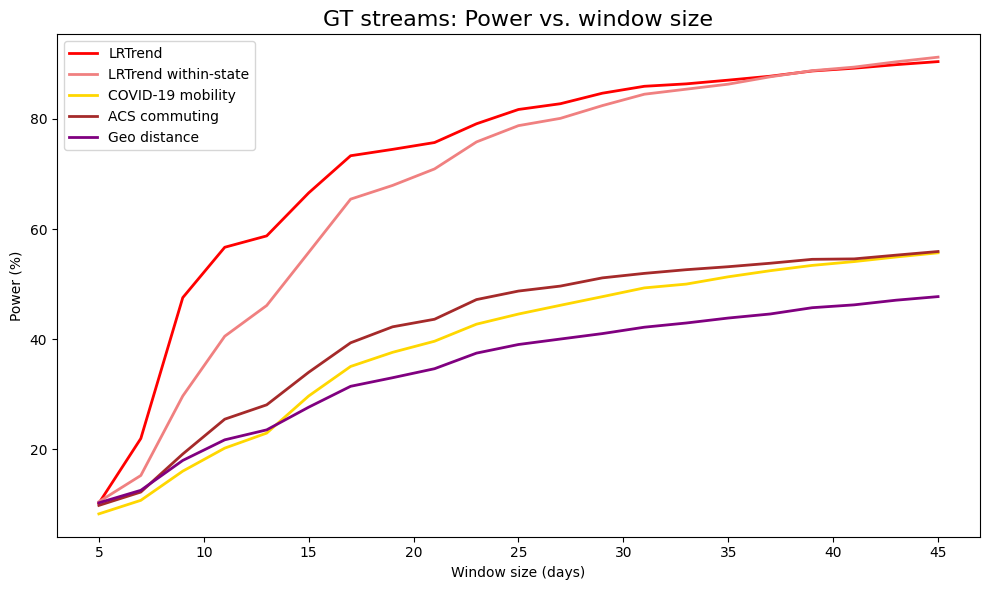

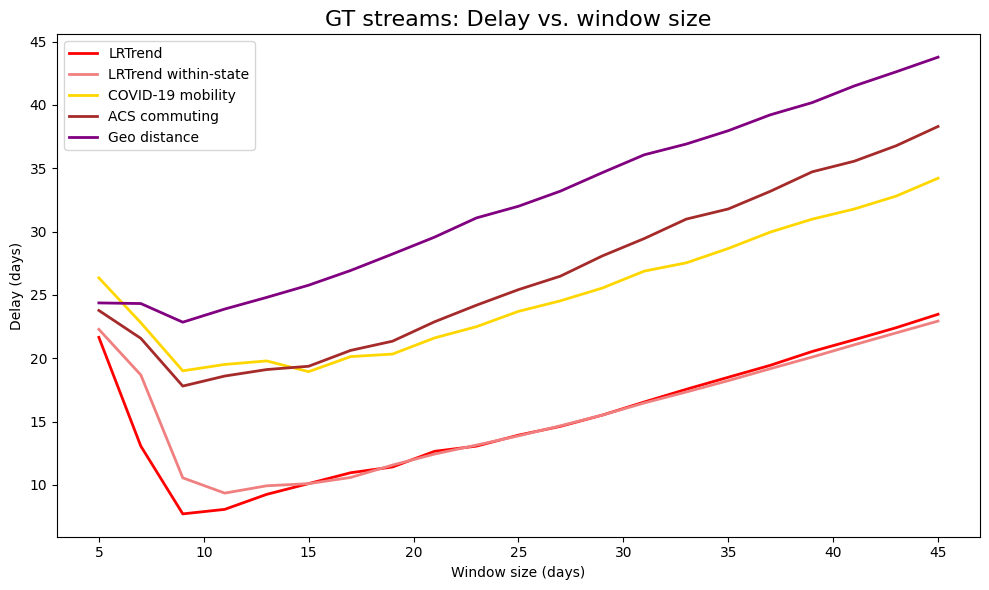

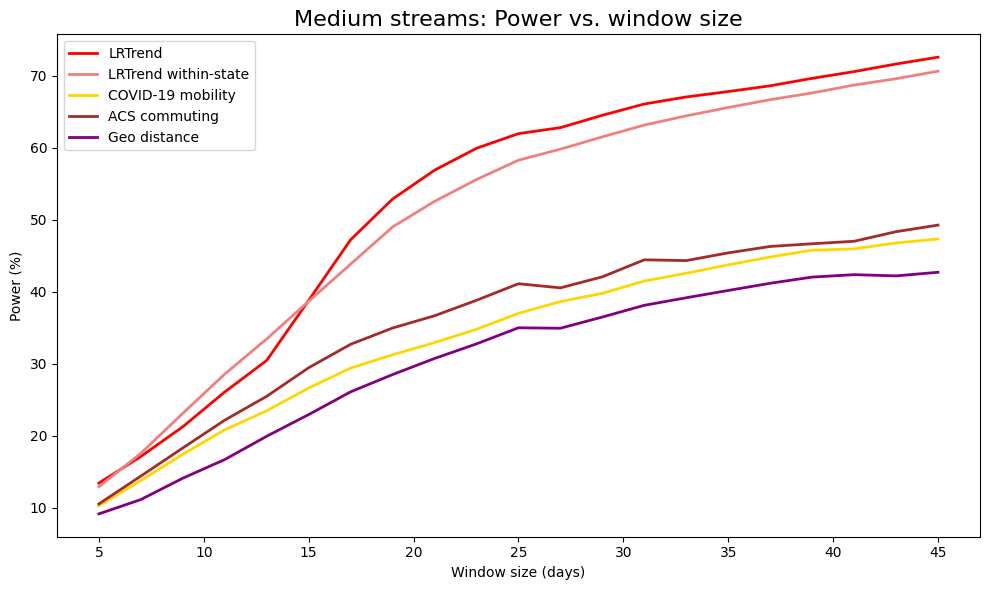

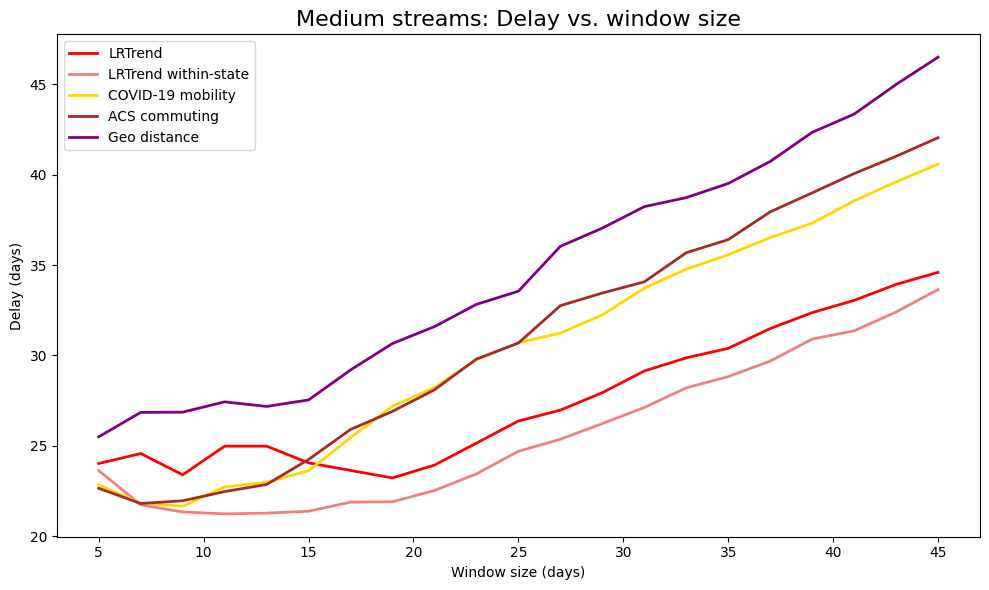

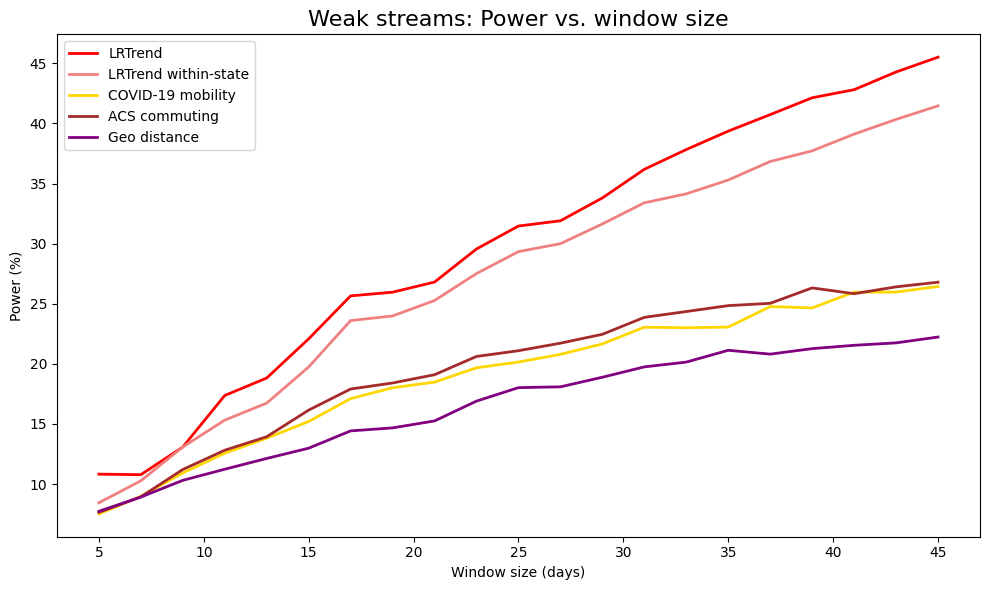

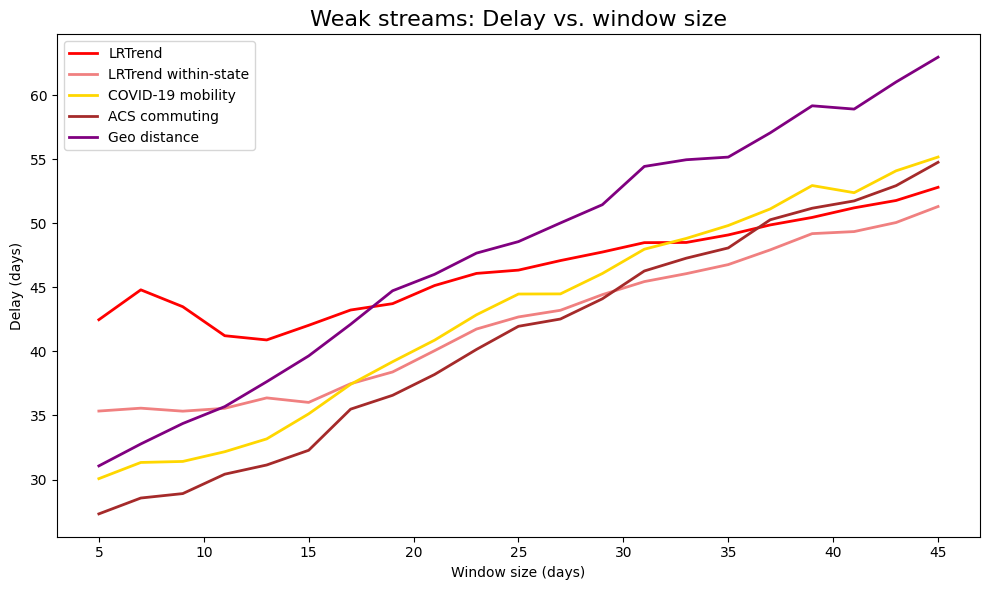

In [1]:
import os
import glob
import re
import numpy as np
import matplotlib.pyplot as plt

GT_streams     = ['CPRadmission', 'JHUcase', 'CHNGclaim']        # example names
medium_streams = ['doctorvisits_adj', 'GoogleS03', 'FBwtested', 'FBwhh', 'GoogleS05']
weak_streams   = ['FBpositive', 'QUIDELpositive', 'FBwcli', 'GoogleS04']
              
# 1) Parse all “*_full*.txt” files into method_data[method][stream][window] = (power, delay)
def parse_reformat_file(path):
    method = os.path.basename(path).split('_')[0]   # e.g. "ACS_full_3gt.txt" → "ACS"
    data = {}
    pattern = re.compile(
        r'window_size\s*=\s*(\d+),\s*power\s*=\s*([\d.]+)%,\s*delay\s*([\d.]+)\s*days'
    )
    with open(path) as f:
        lines = [l.strip() for l in f if l.strip()]
    i = 1  # skip the “alpha = …” line
    while i < len(lines):
        stream = lines[i];  i += 1
        data[stream] = {}
        # consume all the window_size lines
        while i < len(lines) and lines[i].startswith('window_size'):
            m = pattern.match(lines[i])
            if m:
                ws    = int(m.group(1))
                power = float(m.group(2))
                delay = float(m.group(3))
                delay = delay + (ws-1) * 0.5
                data[stream][ws] = (power, delay)
            i += 1
    return method, data

base = 'reformat'
method_data = {}
for fp in glob.glob(os.path.join(base, '*_full*.txt')):
    method, d = parse_reformat_file(fp)
    method_data[method] = d

# 2) Exclude unwanted streams
for m in method_data:
    for bad in ('GoogleS01','GoogleS02','GoogleS06', "CANpositivity", "FBwnohh"):
        method_data[m].pop(bad, None)

# 3) Map method → descriptive label
method_labels = {
    'ACS':       'ACS commuting',
    'Haversine': 'Geo distance',
    'COVID':     'COVID-19 mobility',
    'state':     'LRTrend within-state',
    'global':    'LRTrend',
    'no':        'No aggregation',
}

# 4) For each of your three lists, average power & delay at each window size across those streams.
lists = [('GT',     GT_streams),
         ('Medium', medium_streams),
         ('Weak',   weak_streams)]

# Determine the full set of window‐sizes used anywhere
all_ws = sorted({ws
    for m in method_data.values()
    for s in m.values()
    for ws in s.keys()
})

# Build avg_results[list_name]['power'/'delay'][method] = list of (ws, avg)
avg_results = {}
for name, streams in lists:
    avg_results[name] = {'power': {}, 'delay': {}}
    for method, streams_data in method_data.items():
        p_curve = []
        d_curve = []
        for ws in all_ws:
            # collect all values for this ws & this list of streams
            pvals = [streams_data[s][ws][0]
                     for s in streams
                     if s in streams_data and ws in streams_data[s]]
            dvals = [streams_data[s][ws][1]
                     for s in streams
                     if s in streams_data and ws in streams_data[s]]
            if pvals:
                p_curve.append((ws, np.mean(pvals)))
                d_curve.append((ws, np.mean(dvals)))
        if p_curve:
            avg_results[name]['power'][method] = p_curve
            avg_results[name]['delay'][method] = d_curve

# 5) Plotting ORDER & COLOURS (requested)
#    Order: LRTrend, within state, mobility, commuting, distance
order = ['global', 'state', 'COVID', 'ACS', 'Haversine']
color_map = {
    'global':    'red',        # LRTrend
    'state':     'lightcoral', # within state
    'COVID':     'gold',       # mobility
    'ACS':       'brown',      # commuting
    'Haversine': 'purple',     # distance
}

for name, _ in lists:
    # Power plot
    plt.figure(figsize=(10,6))
    for method in order:
        if method in avg_results[name]['power']:
            ws, ps = zip(*avg_results[name]['power'][method])
            plt.plot(ws, ps,
                     label=method_labels.get(method,method),
                     color=color_map[method],
                     linewidth=2)
    plt.xlabel("Window size (days)")
    plt.ylabel("Power (%)")
    plt.title(f"{name} streams: Power vs. window size", fontsize=16)
    plt.legend(loc='best')
    plt.tight_layout()
    plt.show()

    # Delay plot
    plt.figure(figsize=(10,6))
    for method in order:
        if method in avg_results[name]['delay']:
            ws, ds = zip(*avg_results[name]['delay'][method])
            plt.plot(ws, ds,
                     label=method_labels.get(method,method),
                     color=color_map[method],
                     linewidth=2)
    plt.xlabel("Window size (days)")
    plt.ylabel("Delay (days)")
    plt.title(f"{name} streams: Delay vs. window size", fontsize=16)
    plt.legend(loc='best')
    plt.tight_layout()
    plt.show()


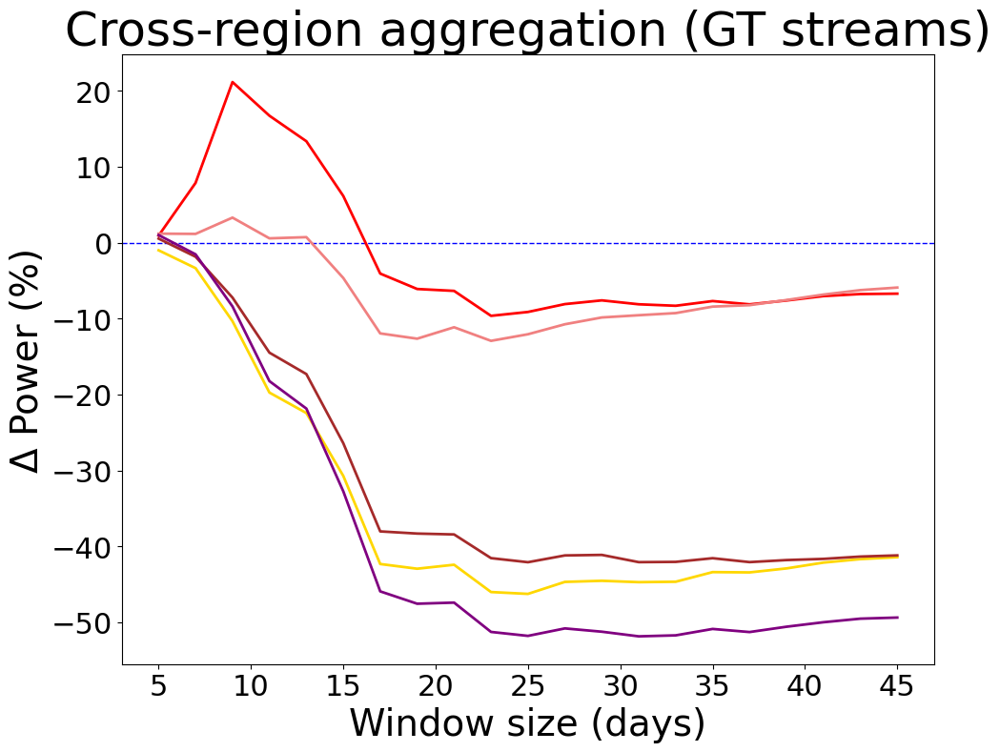

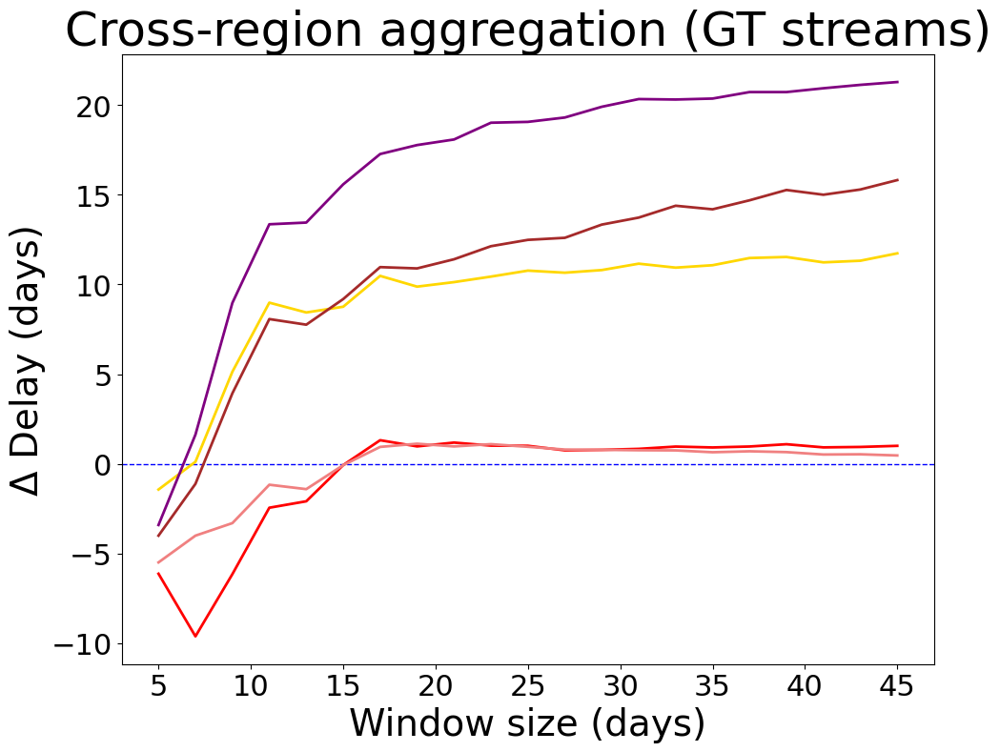

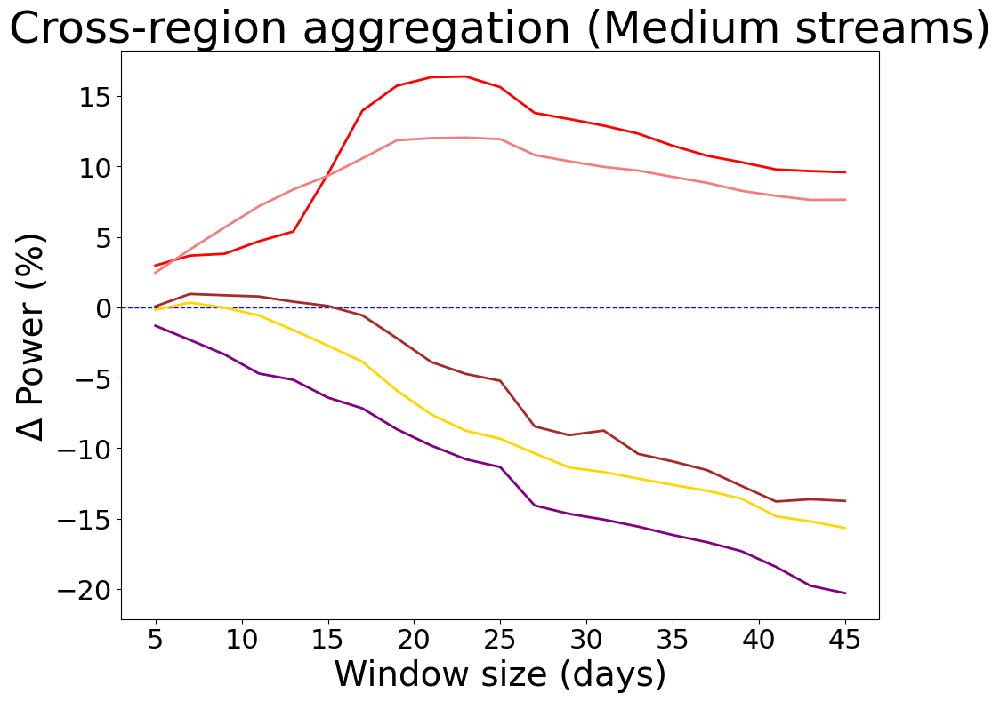

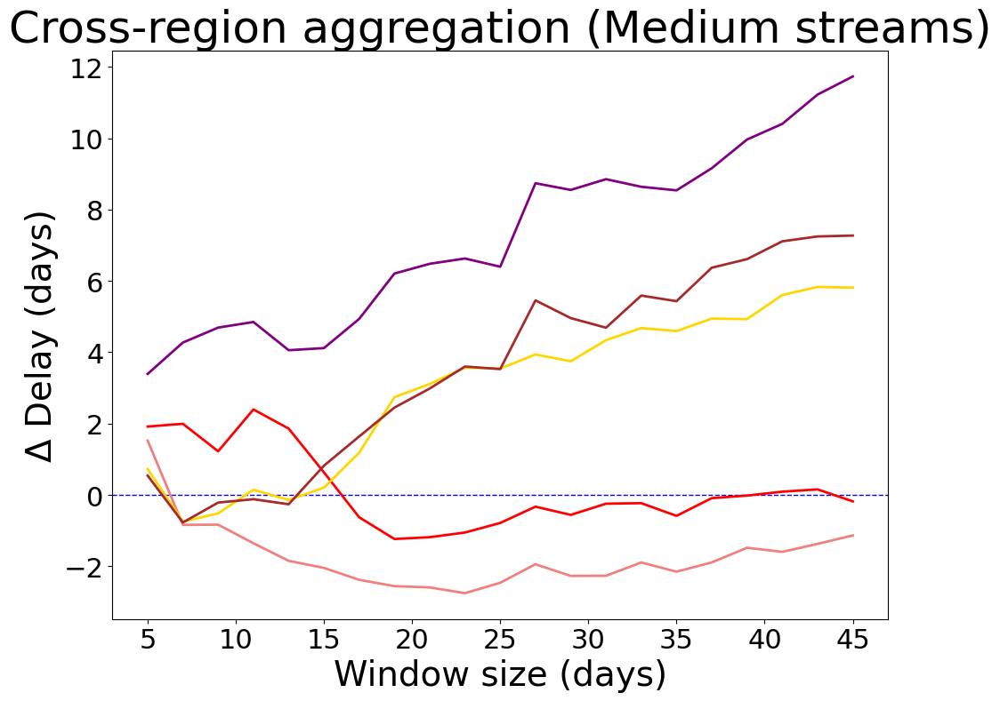

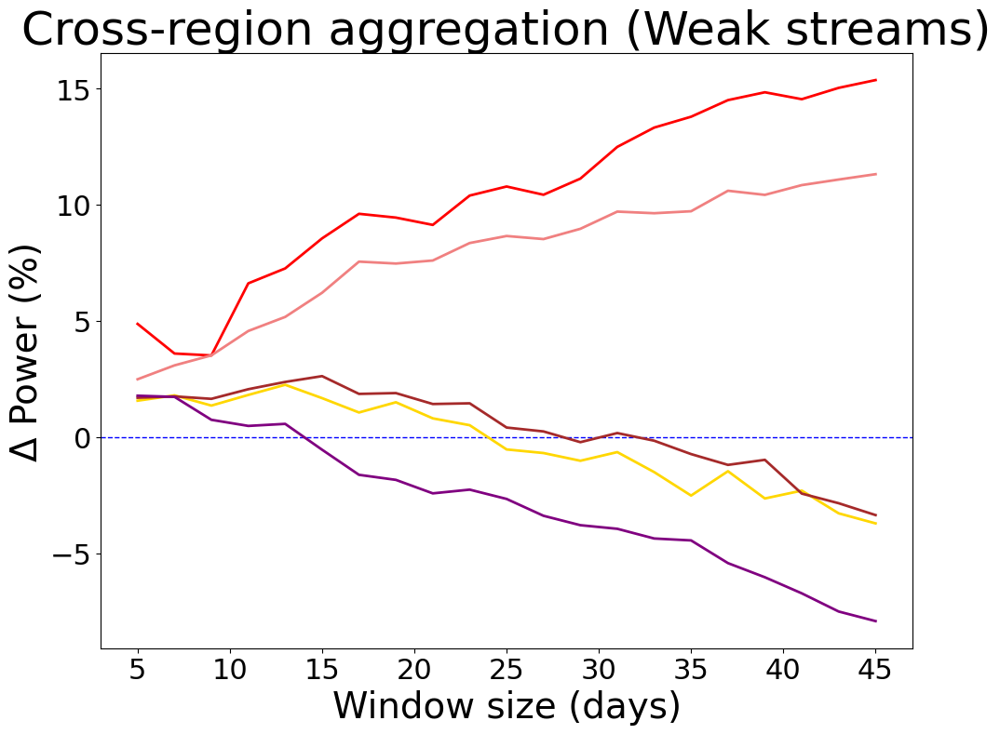

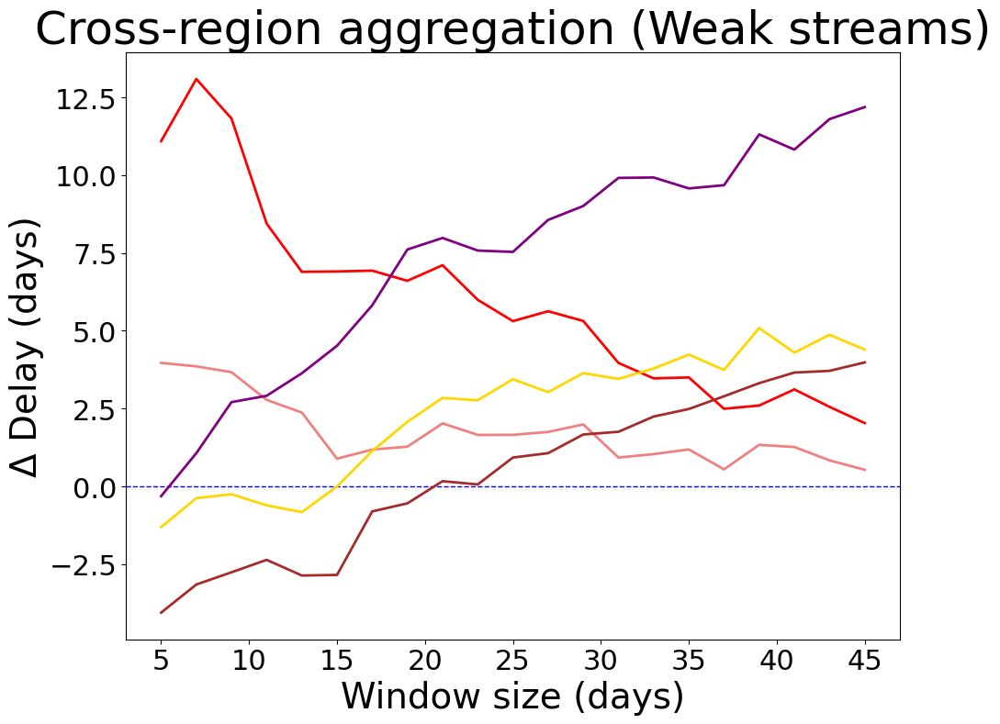

In [2]:
# --- Delta plots relative to "no" aggregation ---

for name, _ in lists:
    # Build a quick lookup for the “no” curves
    no_power = dict(avg_results[name]['power'].get('no', []))
    no_delay = dict(avg_results[name]['delay'].get('no', []))

    # 1) ΔPower plot
    plt.figure(figsize=(10,8))
    plt.axhline(0, color='blue', linewidth=1, linestyle='--', label='No aggregation')

    for method in order:  # same order as above; excludes 'no'
        # pull out the averaged power curve for this method
        pc = dict(avg_results[name]['power'].get(method, []))
        # only keep window sizes that appear in both
        common_ws = sorted(set(pc.keys()) & set(no_power.keys()))
        if not common_ws:
            continue
        ws = common_ws
        delta_p = [pc[w] - no_power[w] for w in ws]

        plt.plot(ws, delta_p,
                 label=method_labels.get(method, method),
                 color=color_map[method],
                 linewidth=2)
    plt.xticks(fontsize=22)
    plt.yticks(fontsize=22)
    plt.xlabel("Window size (days)", fontsize=28)
    plt.ylabel("Δ Power (%)", fontsize=28)
    plt.title(f"Cross-region aggregation ({name} streams)", fontsize=36)
    #plt.legend(loc='best')
    plt.tight_layout()
    plt.savefig(f'agg_delta_{name}', dpi=300, bbox_inches='tight')
    plt.show()

    # 2) ΔDelay plot
    plt.figure(figsize=(10,8))
    plt.axhline(0, color='blue', linewidth=1, linestyle='--', label='No aggregation')

    for method in order:
        dc = dict(avg_results[name]['delay'].get(method, []))
        common_ws = sorted(set(dc.keys()) & set(no_delay.keys()))
        if not common_ws:
            continue
        ws = common_ws
        delta_d = [dc[w] - no_delay[w] for w in ws]

        plt.plot(ws, delta_d,
                 label=method_labels.get(method, method),
                 color=color_map[method],
                 linewidth=2)
    plt.xticks(fontsize=22)
    plt.yticks(fontsize=22)
    plt.xlabel("Window size (days)", fontsize=28)
    plt.ylabel("Δ Delay (days)", fontsize=28)
    plt.title(f"Cross-region aggregation ({name} streams)", fontsize=36)
    plt.savefig(f'agg_delta_delay_{name}', dpi=300, bbox_inches='tight')
    plt.tight_layout()
    plt.show()


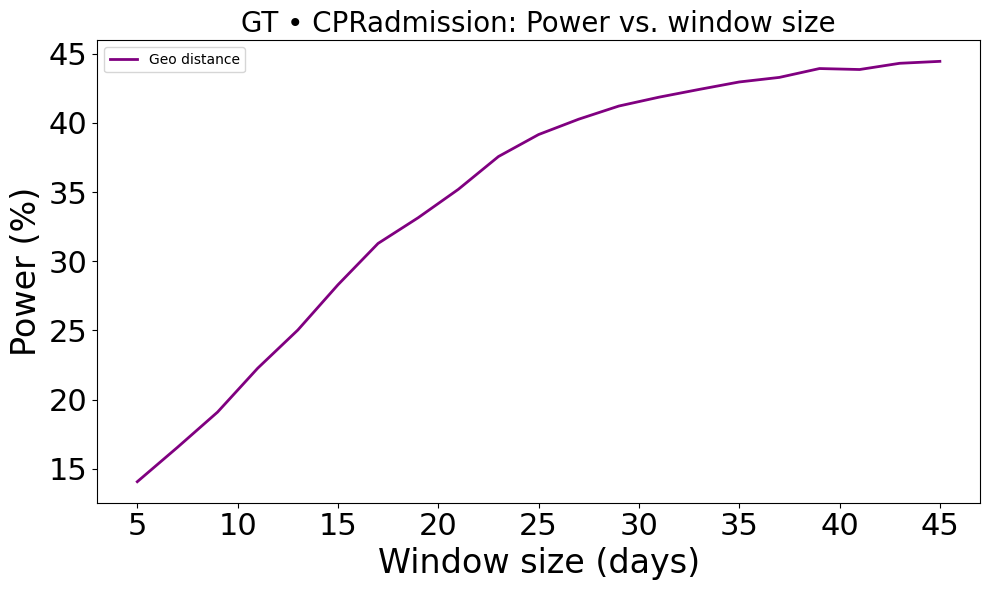

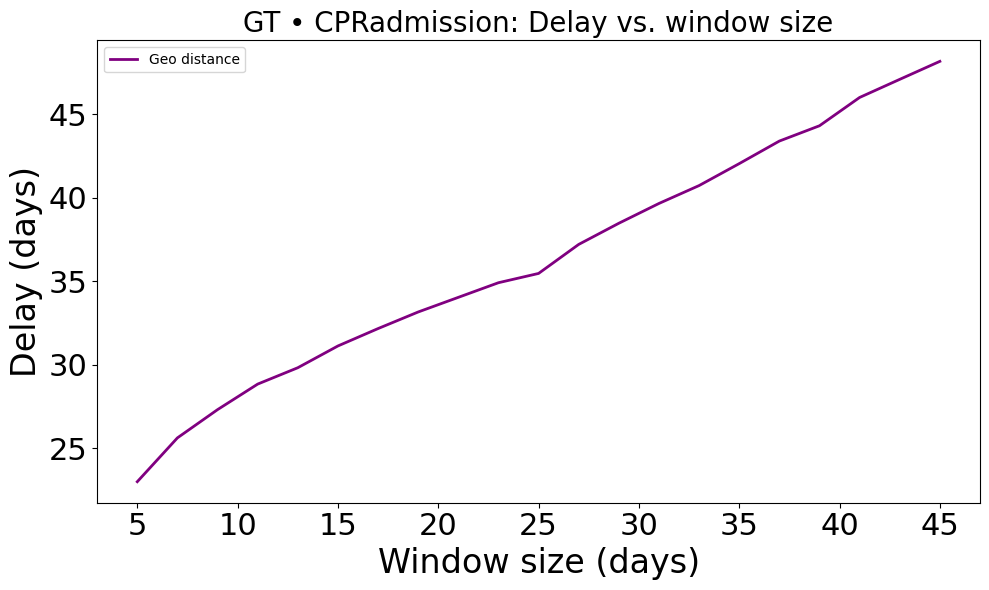

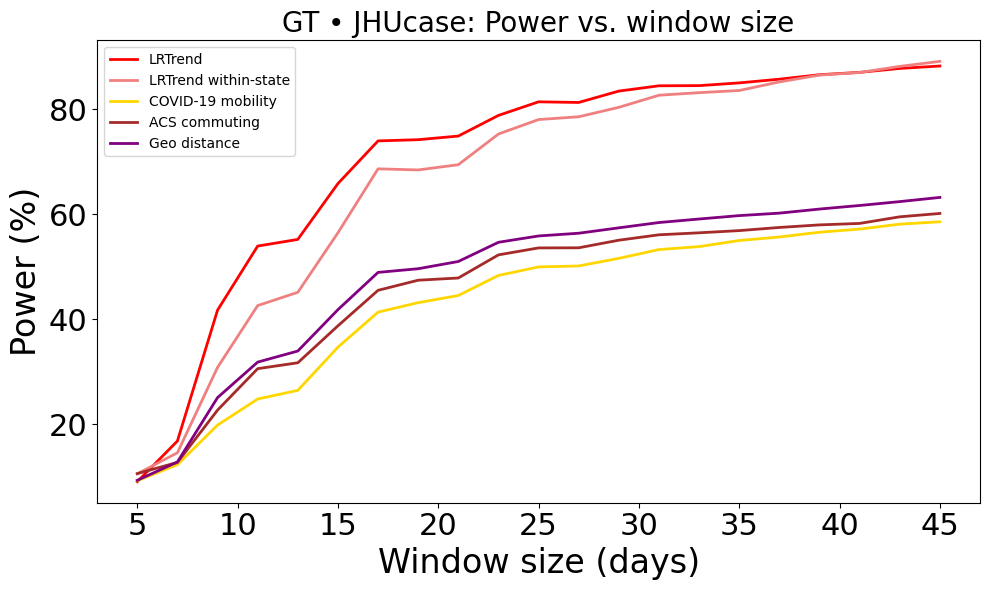

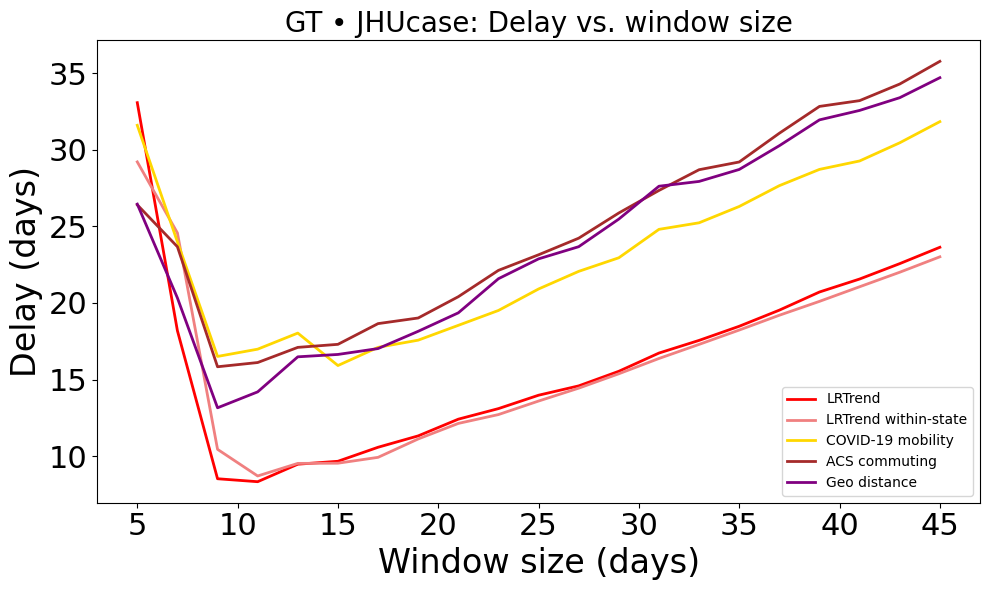

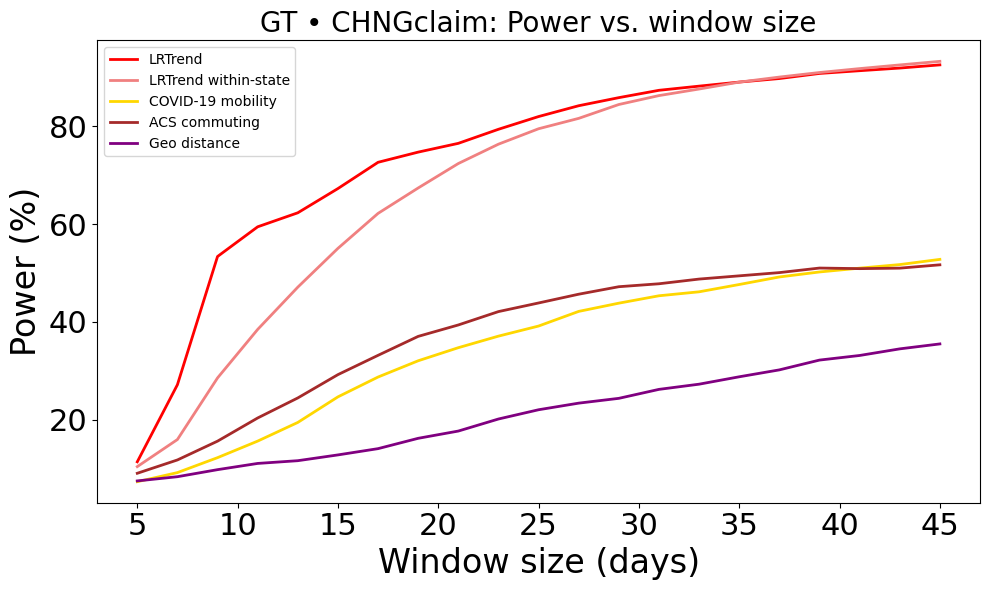

...

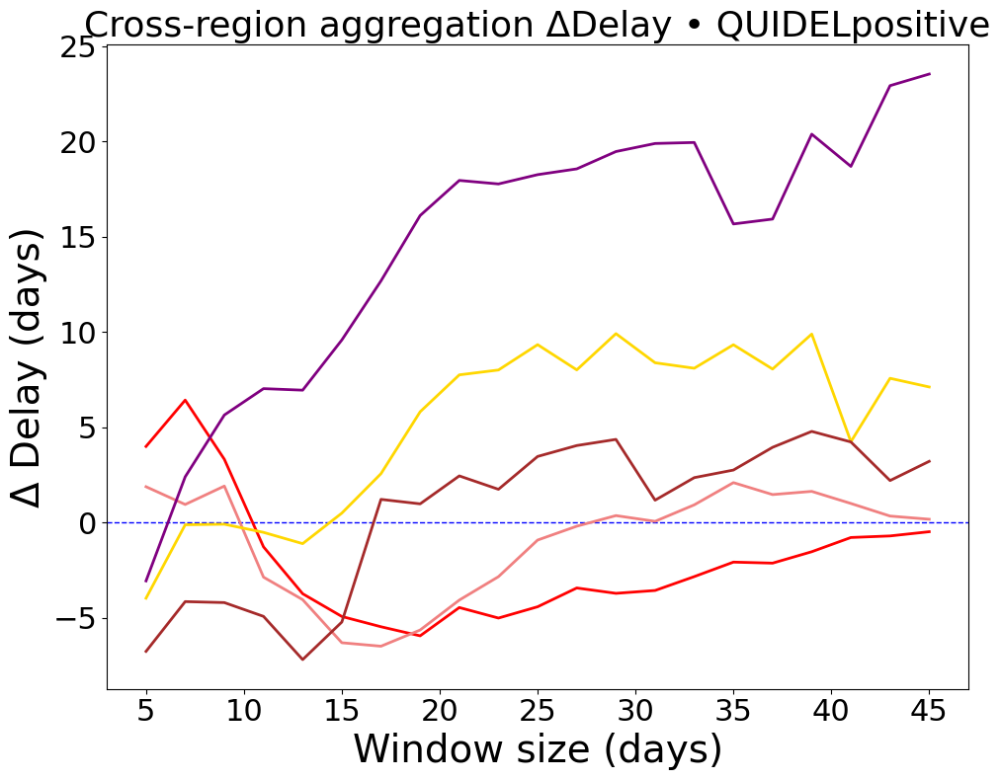

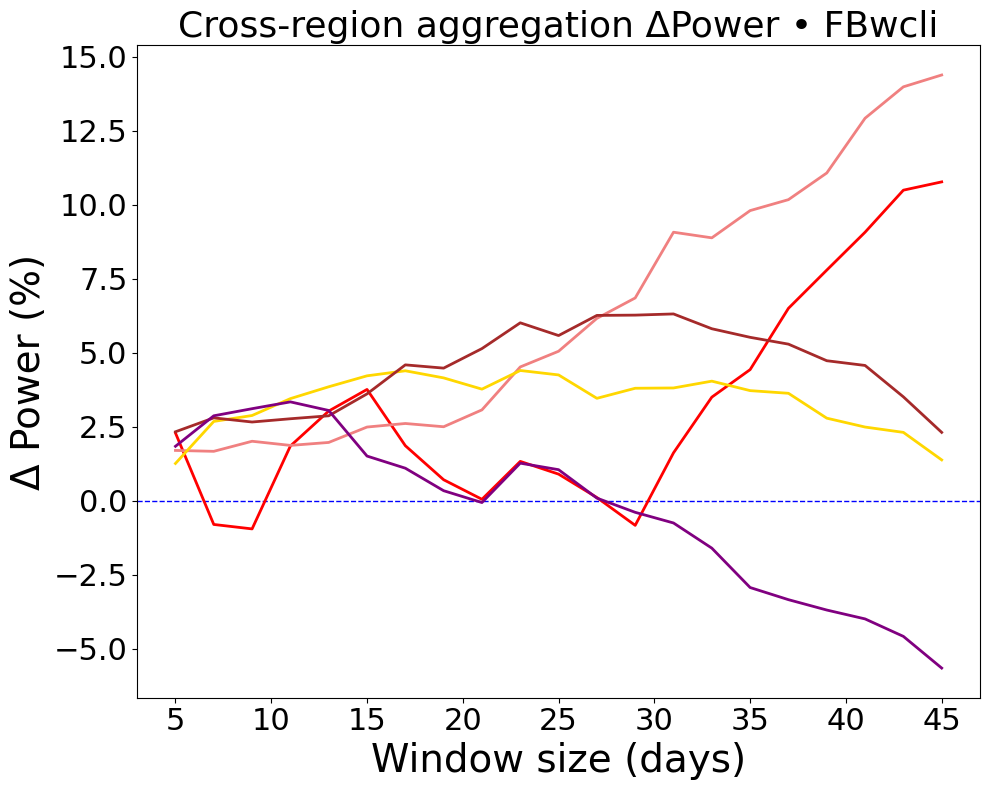

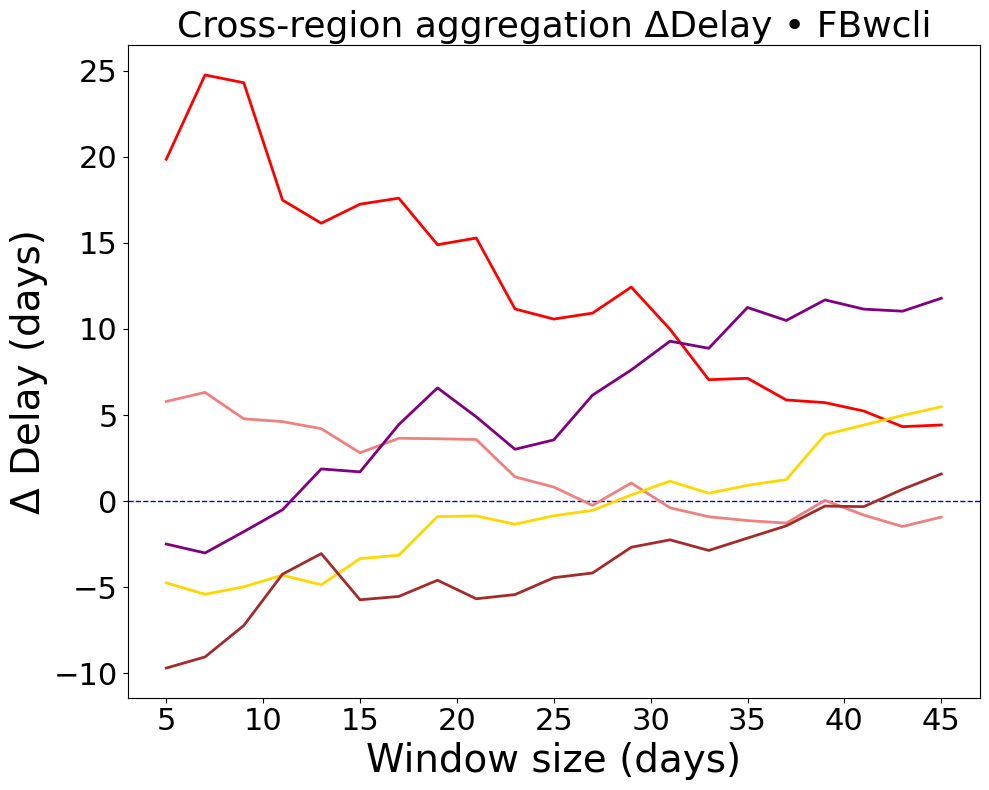

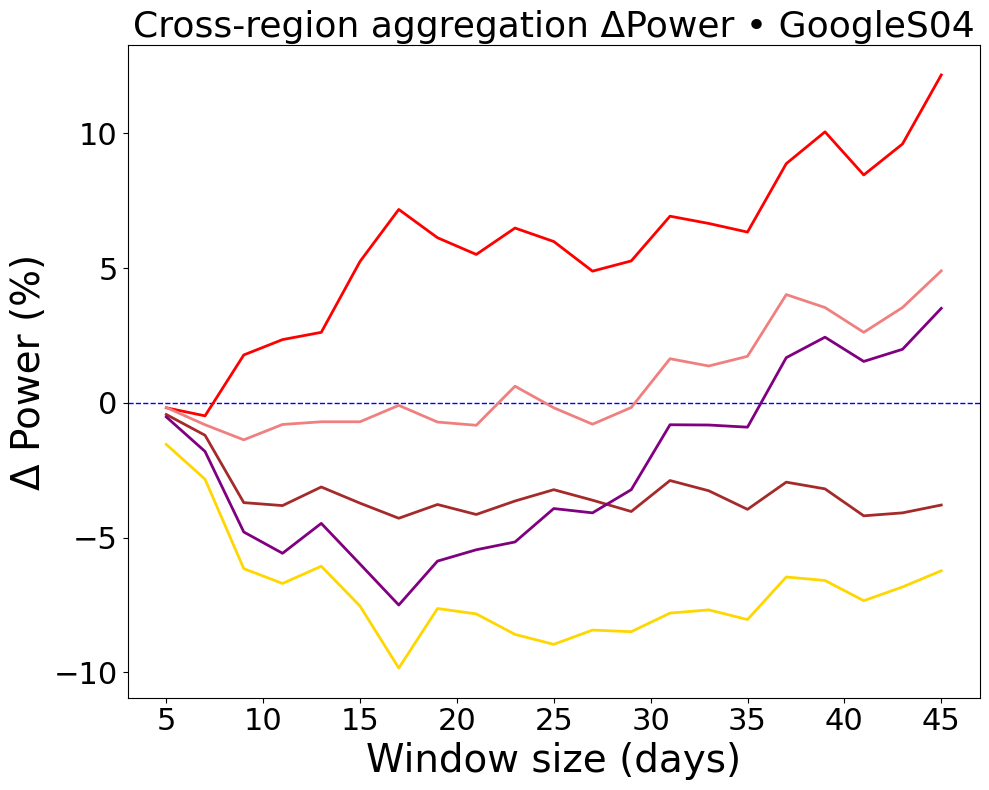

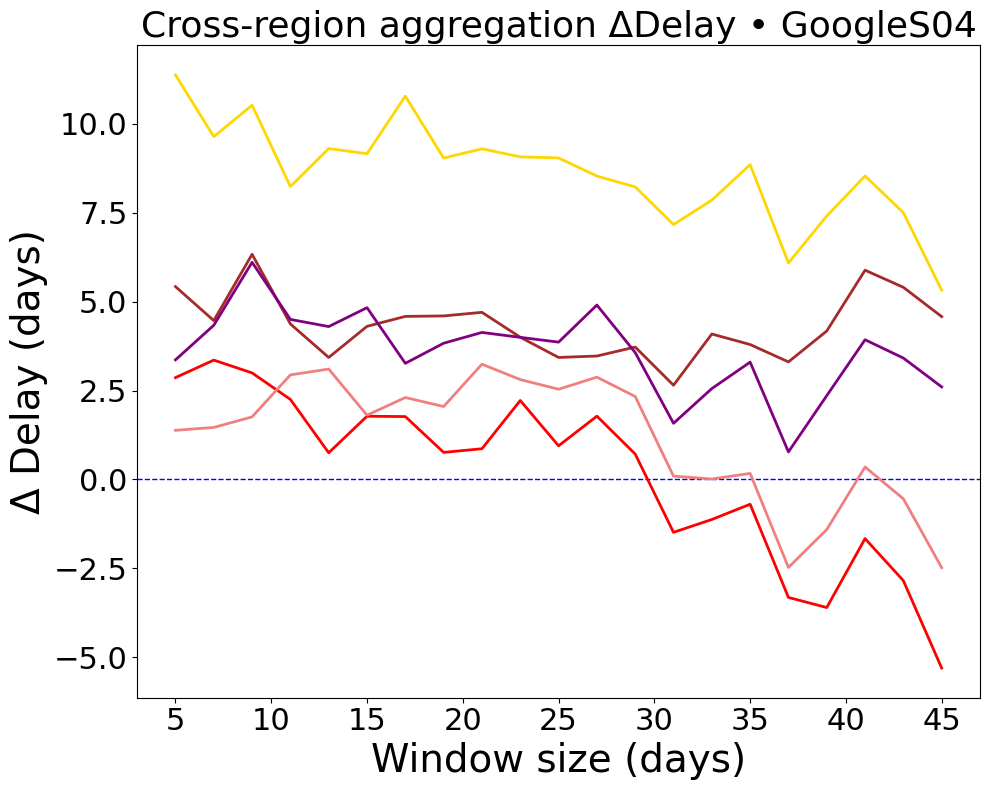

In [3]:
import os
import glob
import re
import numpy as np
import matplotlib.pyplot as plt

GT_streams     = ['CPRadmission', 'JHUcase', 'CHNGclaim']        # example names
medium_streams = ['doctorvisits_adj', 'GoogleS03', 'FBwtested', 'FBwhh', 'GoogleS05']
weak_streams   = ['FBpositive', 'QUIDELpositive', 'FBwcli', 'GoogleS04']

# ---------------------- 1) Parse files into method_data ----------------------
# method_data[method][stream][window] = (power, delay)
def parse_reformat_file(path):
    method = os.path.basename(path).split('_')[0]   # e.g. "ACS_full_3gt.txt" → "ACS"
    data = {}
    pattern = re.compile(
        r'window_size\s*=\s*(\d+),\s*power\s*=\s*([\d.]+)%,\s*delay\s*([\d.]+)\s*days'
    )
    with open(path) as f:
        lines = [l.strip() for l in f if l.strip()]
    i = 1  # skip the “alpha = …” line
    while i < len(lines):
        stream = lines[i];  i += 1
        data[stream] = {}
        # consume all the window_size lines
        while i < len(lines) and lines[i].startswith('window_size'):
            m = pattern.match(lines[i])
            if m:
                ws    = int(m.group(1))
                power = float(m.group(2))
                delay = float(m.group(3))
                delay = delay + (ws-1) * 0.5  # adjusted delay
                data[stream][ws] = (power, delay)
            i += 1
    return method, data

base = 'reformat'
method_data = {}
for fp in glob.glob(os.path.join(base, '*_full*.txt')):
    method, d = parse_reformat_file(fp)
    method_data[method] = d

# ---------------------- 2) Exclude unwanted streams -------------------------
for m in method_data:
    for bad in ('GoogleS01','GoogleS02','GoogleS06', "CANpositivity", "FBwnohh"):
        method_data[m].pop(bad, None)

# ---------------------- 3) Method labels & plot style -----------------------
method_labels = {
    'ACS':       'ACS commuting',
    'Haversine': 'Geo distance',
    'COVID':     'COVID-19 mobility',
    'state':     'LRTrend within-state',
    'global':    'LRTrend',
    'no':        'No aggregation',
}

# Order & colors (as requested)
order = ['global', 'state', 'COVID', 'ACS', 'Haversine']
color_map = {
    'global':    'red',        # LRTrend
    'state':     'lightcoral', # within state
    'COVID':     'gold',       # mobility
    'ACS':       'brown',      # commuting
    'Haversine': 'purple',     # distance
}

# ---------------------- 4) Collect per-stream curves (no averaging) ---------
# stream_results[stream]['power'][method] = list[(ws, power)]
# stream_results[stream]['delay'][method] = list[(ws, delay)]
all_streams = GT_streams + medium_streams + weak_streams
stream_results = {s: {'power': {}, 'delay': {}} for s in all_streams}

for method, streams_data in method_data.items():
    for s in all_streams:
        if s in streams_data:
            xs = sorted(streams_data[s].keys())
            p_curve = [(ws, streams_data[s][ws][0]) for ws in xs]
            d_curve = [(ws, streams_data[s][ws][1]) for ws in xs]
            if p_curve:
                stream_results[s]['power'][method] = p_curve
                stream_results[s]['delay'][method] = d_curve

# ---------------------- 5) Plot each stream: Power & Delay -------------------
plt.rcParams.update({'xtick.labelsize': 22,
                     'ytick.labelsize': 22,
                     'axes.labelsize': 24})

lists = [('GT', GT_streams), ('Medium', medium_streams), ('Weak', weak_streams)]

for group_name, streams in lists:
    for s in streams:
        # --- Power plot for this stream ---
        plt.figure(figsize=(10,6))
        has_any = False
        for method in order:
            curve = stream_results[s]['power'].get(method)
            if curve:
                ws, ps = zip(*curve)
                plt.plot(ws, ps,
                         label=method_labels.get(method, method),
                         color=color_map[method],
                         linewidth=2)
                has_any = True
        if has_any:
            plt.xlabel("Window size (days)")
            plt.ylabel("Power (%)")
            plt.title(f"{group_name} • {s}: Power vs. window size", fontsize=20)
            plt.legend(loc='best')
            plt.tight_layout()
            plt.savefig(f'perstream_power_{group_name}_{s}.png', dpi=300)
            plt.show()
        else:
            plt.close()

        # --- Delay plot for this stream ---
        plt.figure(figsize=(10,6))
        has_any = False
        for method in order:
            curve = stream_results[s]['delay'].get(method)
            if curve:
                ws, ds = zip(*curve)
                plt.plot(ws, ds,
                         label=method_labels.get(method, method),
                         color=color_map[method],
                         linewidth=2)
                has_any = True
        if has_any:
            plt.xlabel("Window size (days)")
            plt.ylabel("Delay (days)")
            plt.title(f"{group_name} • {s}: Delay vs. window size", fontsize=20)
            plt.legend(loc='best')
            plt.tight_layout()
            plt.savefig(f'perstream_delay_{group_name}_{s}.png', dpi=300)
            plt.show()
        else:
            plt.close()

# ---------------------- 6) Δ plots vs. "no" per stream ----------------------
for group_name, streams in lists:
    for s in streams:
        # Build quick lookup for this stream's "no" curves
        no_power_curve = dict(stream_results[s]['power'].get('no', []))
        no_delay_curve = dict(stream_results[s]['delay'].get('no', []))

        # --- ΔPower plot ---
        plt.figure(figsize=(10,8))
        plt.axhline(0, color='blue', linewidth=1, linestyle='--', label='No aggregation')
        plotted = False

        for method in order:
            # compare each method to "no"
            pc = dict(stream_results[s]['power'].get(method, []))
            common_ws = sorted(set(pc.keys()) & set(no_power_curve.keys()))
            if not common_ws:
                continue
            delta_p = [pc[w] - no_power_curve[w] for w in common_ws]
            plt.plot(common_ws, delta_p,
                     label=method_labels.get(method, method),
                     color=color_map[method],
                     linewidth=2)
            plotted = True

        if plotted:
            plt.xticks(fontsize=22)
            plt.yticks(fontsize=22)
            plt.xlabel("Window size (days)", fontsize=28)
            plt.ylabel("Δ Power (%)", fontsize=28)
            plt.title(f"Cross-region aggregation ΔPower • {s}", fontsize=26)
            # plt.legend(loc='best')
            plt.tight_layout()
            plt.savefig(f'perstream_delta_power_{s}.png', dpi=300)
            plt.show()
        else:
            plt.close()

        # --- ΔDelay plot ---
        plt.figure(figsize=(10,8))
        plt.axhline(0, color='blue', linewidth=1, linestyle='--', label='No aggregation')
        plotted = False

        for method in order:
            dc = dict(stream_results[s]['delay'].get(method, []))
            common_ws = sorted(set(dc.keys()) & set(no_delay_curve.keys()))
            if not common_ws:
                continue
            delta_d = [dc[w] - no_delay_curve[w] for w in common_ws]
            plt.plot(common_ws, delta_d,
                     label=method_labels.get(method, method),
                     color=color_map[method],
                     linewidth=2)
            plotted = True

        if plotted:
            plt.xticks(fontsize=22)
            plt.yticks(fontsize=22)
            plt.xlabel("Window size (days)", fontsize=28)
            plt.ylabel("Δ Delay (days)", fontsize=28)
            plt.title(f"Cross-region aggregation ΔDelay • {s}", fontsize=26)
            plt.tight_layout()
            plt.savefig(f'perstream_delta_delay_{s}.png', dpi=300, bbox_inches='tight')
            plt.show()
        else:
            plt.close()


In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

COVIDmatrix = pd.read_csv('../HHS_COVID19USWeeklyFlowsSum.csv', index_col = 0)
COVIDmatrix.index = COVIDmatrix.index.astype(str).str.zfill(3)

ACSmatrix = pd.read_csv('../HHS_Flows.csv', index_col = 0)
ACSmatrix.index = ACSmatrix.index.astype(str).str.zfill(3)

haversine = pd.read_csv('../Haversine_update.csv', index_col = 0)
haversine.index = haversine.index.astype(str).str.zfill(3)


In [5]:
# Start with the intersection of the first three datasets
common_hrrs = set(COVIDmatrix.index) & set(ACSmatrix.index) & set(haversine.index)

data_streams = ['CPRadmission', 'JHUcase', 'CHNGclaim',
                'FBwhh', 'FBwtested', 'FBpositive', 'GoogleS03', 'GoogleS04', 'GoogleS05',
                'doctorvisits_adj', 'QUIDELpositive', 'FBwcli']

distances_dict = {}  # Optional: store processed distances if needed later

for stream in data_streams:
    distances = pd.read_csv(f'dist_csvs/csv/{stream}_3NN_35.csv', index_col=0)
    
    # Ensure index and columns are strings (usually already true if reading from CSV)
    distances.index = distances.columns = distances.index.astype(str)
    
    # Intersect common_hrrs with this distance matrix's HRRs
    common_hrrs &= set(distances.index)

    # Optionally store it for later use
    distances_dict[stream] = distances

# Sort final list after full intersection
common_hrrs = sorted(common_hrrs)

In [6]:
import pandas as pd
import numpy as np

hrr_map = pd.read_csv('dist_csvs/geocorr2014.csv')[['hrr', 'hrrname']].drop_duplicates().iloc[1:].sort_values(by = 'hrr')
hrr_map['hrrstate'] = hrr_map['hrrname'].apply(lambda x: x.split('-')[0].strip())
hrr2state = hrr_map[['hrr', 'hrrstate']].set_index('hrr').T.to_dict('records')[0]
state2hrr = {}
for hrr, hrrstate in hrr2state.items():
    if hrrstate not in state2hrr:
        state2hrr[hrrstate] = []
    state2hrr[hrrstate].append(hrr)
# for k in state2hrr.keys():
#     print(k, len(state2hrr[k]))
for state, hrr_list in sorted(state2hrr.items(), key=lambda x: len(x[1])):
    print(state, len(hrr_list))

AK 1
DE 1
DC 1
HI 1
NM 1
RI 1
VT 1
WY 1
ID 2
KS 2
ME 2
NE 2
NV 2
NH 2
SD 2
CT 3
MD 3
MA 3
MT 3
OK 3
UT 3
WV 3
AZ 4
ND 4
AR 5
KY 5
MN 5
OR 5
SC 5
AL 6
MS 6
MO 6
WA 6
CO 7
GA 7
NJ 7
TN 7
IA 8
VA 8
WI 8
IN 9
NC 9
LA 10
NY 10
OH 10
IL 13
PA 14
MI 15
FL 18
TX 22
CA 24


In [7]:
import pandas as pd
import matplotlib.pyplot as plt

# Simulated input: one stream and a dummy hrr2state map for testing purposes
data_streams = ['CPRadmission', 'JHUcase', 'CHNGclaim',
               'FBwhh', 'FBwtested', 'FBpositive', 'GoogleS03', 'GoogleS04', 'GoogleS05',
               'doctorvisits_adj', 'QUIDELpositive', 'FBwcli']

# Initialize results
results = []

for stream in data_streams:
    # Load CSV and preserve leading zeros
    distances = pd.read_csv(f'dist_csvs/csv/{stream}_3NN_35.csv', index_col=0)
    
    # Convert to numeric while keeping index/columns as strings
    distances.index=distances.columns

    distances = distances.loc[common_hrrs, common_hrrs]
    
    in_state_count = 0
    out_state_count = 0
    
    for hrr in distances.index:
        if hrr not in hrr2state:
            continue
        row = distances.loc[hrr].drop(hrr)  # Exclude self
        nearest_neighbors = row.nsmallest(3).index  # Get 3 nearest neighbors
        for neighbor in nearest_neighbors:
            if hrr2state.get(neighbor) == hrr2state[hrr]:
                in_state_count += 1
            else:
                out_state_count += 1

    total = in_state_count + out_state_count
    if total > 0:
        in_prop = in_state_count / total * 100
        out_prop = out_state_count / total * 100
    else:
        in_prop = out_prop = 0

    results.append({
        'stream': stream,
        'in_state': in_state_count,
        'out_state': out_state_count,
        'in_state_pct': in_prop,
        'out_state_pct': out_prop
    })

# Convert results to DataFrame for plotting
results_df = pd.DataFrame(results)


In [8]:
#bootstrap across states, make color scheme better

In [9]:
def compute_in_out_state_stats(matrix, label, hrr2state, common_hrrs):
    matrix = matrix.loc[common_hrrs, common_hrrs]

    in_state_count = 0
    out_state_count = 0

    for hrr in matrix.index:
        if hrr not in hrr2state:
            continue
        row = matrix.loc[hrr].drop(hrr, errors='ignore')  # Exclude self

        # Use nlargest for flow matrices, nsmallest for distance
        if label.lower().startswith(('covid', 'acs')):
            neighbors = row.nlargest(3).index
        else:
            neighbors = row.nsmallest(3).index

        for neighbor in neighbors:
            if hrr2state.get(neighbor) == hrr2state[hrr]:
                in_state_count += 1
            else:
                out_state_count += 1

    total = in_state_count + out_state_count
    if total > 0:
        in_prop = in_state_count / total * 100
        out_prop = out_state_count / total * 100
    else:
        in_prop = out_prop = 0

    return {
        'stream': label,
        'in_state': in_state_count,
        'out_state': out_state_count,
        'in_state_pct': in_prop,
        'out_state_pct': out_prop
    }


# Compute metrics for each of the three matrices
new_results = [
    compute_in_out_state_stats(COVIDmatrix, 'COVIDmatrix', hrr2state, common_hrrs),
    compute_in_out_state_stats(ACSmatrix, 'ACSmatrix', hrr2state, common_hrrs),
    compute_in_out_state_stats(haversine, 'haversine', hrr2state, common_hrrs),
]

# Convert to DataFrame and concatenate with existing results_df
results_df = pd.concat([results_df, pd.DataFrame(new_results)], ignore_index=True)

In [10]:
results_df

,stream,in_state,out_state,in_state_pct,out_state_pct
0,CPRadmission,54,132,29.032258,70.967742
1,JHUcase,61,125,32.795699,67.204301
2,CHNGclaim,50,136,26.881720,73.118280
3,FBwhh,34,152,18.279570,81.720430
4,FBwtested,34,152,18.279570,81.720430
5,FBpositive,7,179,3.763441,96.236559
6,GoogleS03,23,163,12.365591,87.634409
7,GoogleS04,49,137,26.344086,73.655914
8,GoogleS05,39,147,20.967742,79.032258
9,doctorvisits_adj,43,143,23.118280,76.881720


In [11]:
import random

# 4) Simulate random neighbor assignments 100 times to estimate chance in-state %
all_hrrs = list(hrr2state.keys())
in_state_props = []

for a in range(100):
    in_state_count = 0
    total_count = 0
    for hrr in all_hrrs:
        if hrr not in hrr2state:
            continue
        random_neighbors = random.sample([x for x in all_hrrs if x != hrr], 3)
        for neighbor in random_neighbors:
            if hrr2state.get(neighbor) == hrr2state[hrr]:
                in_state_count += 1
            total_count += 1
    in_state_props.append(100 * in_state_count / total_count)

avg_random_in_state_pct = sum(in_state_props) / len(in_state_props)


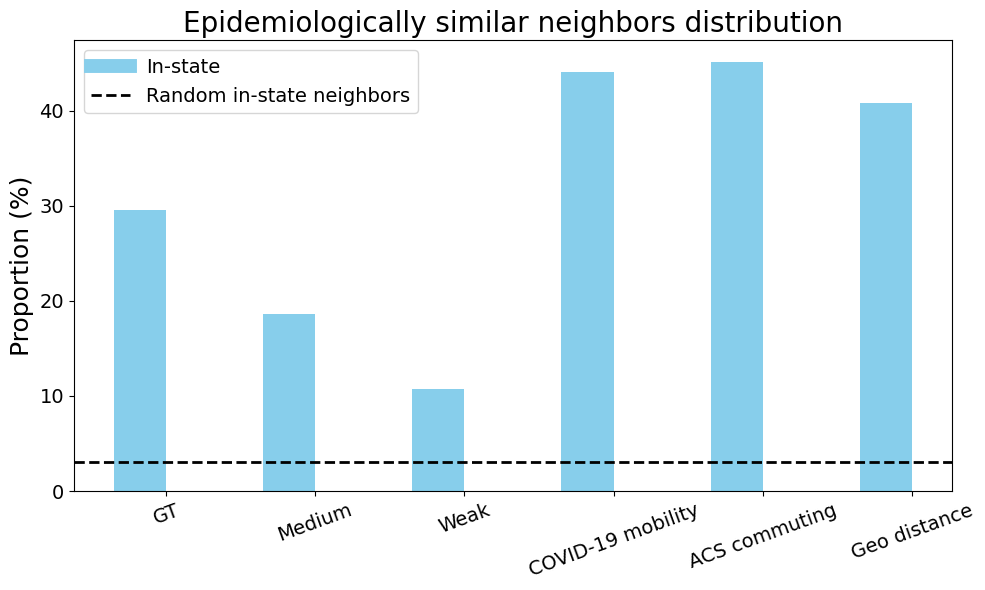

In [12]:
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt

# 1) Define the groups
group_defs = {
    'GT':     GT_streams,
    'Medium': medium_streams,
    'Weak':   weak_streams,
}

# 2) Compute the average in/out‐state % for each group
group_results = []
for grp, streams in group_defs.items():
    sub = results_df[results_df['stream'].isin(streams)]
    group_results.append({
        'label': grp,
        'in_state_pct':  sub['in_state_pct'].mean(),
        'out_state_pct': sub['out_state_pct'].mean()
    })

# 3) Add the three individual matrices
matrix_labels = {
    'COVIDmatrix': 'COVID-19 mobility',
    'ACSmatrix': 'ACS commuting',
    'haversine': 'Geo distance'
}
for key, label in matrix_labels.items():
    row = results_df[results_df['stream'] == key].iloc[0]
    group_results.append({
        'label': label,
        'in_state_pct': row['in_state_pct'],
        'out_state_pct': row['out_state_pct']
    })

# 4) Create DataFrame for plotting
group_df = pd.DataFrame(group_results)

# 5) Plot
bar_width = 0.35
x = range(len(group_df))

plt.figure(figsize=(10, 6))

# Plot bars
in_bar  = plt.bar(x, group_df['in_state_pct'], width=bar_width, color='skyblue')
#out_bar = plt.bar([i + bar_width for i in x], group_df['out_state_pct'], width=bar_width, color='lightcoral')

# Plot reference line for expected chance level
chance_line = plt.axhline(avg_random_in_state_pct, color='black', linestyle='--', linewidth=2)

# Set axis ticks and labels
plt.xticks([i + bar_width / 2 for i in x], group_df['label'], fontsize=14, rotation=20)
plt.yticks(fontsize=14)
plt.ylabel("Proportion (%)", fontsize=18)
plt.title("Epidemiologically similar neighbors distribution", fontsize=20)

# Custom legend
custom_handles = [
    Line2D([0], [0], color='skyblue', lw=10),
    #Line2D([0], [0], color='lightcoral', lw=10),
    Line2D([0], [0], color='black', linestyle='--', lw=2),
]
custom_labels = [
    'In-state',
    #'Out-of-state',
    'Random in-state neighbors'
]
plt.legend(handles=custom_handles, labels=custom_labels, fontsize=14, loc='upper left')

# Save and show
plt.tight_layout()
plt.savefig('neighbors_distribution_with_matrices.png', dpi=300)
plt.show()


In [13]:
import numpy as np
import pandas as pd

# ------------------------
# 1. per‑stream statistics
# ------------------------
data_streams = [
    'CPRadmission', 'JHUcase', 'CHNGclaim',
    'FBwhh', 'FBwtested', 'FBpositive',
    'GoogleS03', 'GoogleS04', 'GoogleS05',
    'doctorvisits_adj', 'QUIDELpositive', 'FBwcli'
]

results = []

for stream in data_streams:
    # read distance matrix
    distances = pd.read_csv(f'dist_csvs/csv/{stream}_3NN_35.csv', index_col=0)
    distances.index = distances.columns = distances.index.astype(str)

    # keep only common HRRs
    distances = distances.loc[common_hrrs, common_hrrs]

    # ---------- helper to compute in‑state % ----------
    def _in_state_pct(idx):
        in_n, out_n = 0, 0
        for hrr in idx:
            if hrr not in hrr2state:            # safety
                continue
            row = distances.loc[hrr, idx].drop(hrr, errors='ignore')
            nbrs = row.nsmallest(3).index       # distance ⇒ smaller = closer
            for nbr in nbrs:
                if hrr2state.get(nbr) == hrr2state[hrr]:
                    in_n += 1
                else:
                    out_n += 1
        return 100 * in_n / (in_n + out_n) if (in_n + out_n) else 0.0
    # --------------------------------------------------

    # full‑data estimate
    full_pct = _in_state_pct(distances.index)

    # jackknife across states (leave‑one‑state‑out)
    states = sorted({hrr2state[h] for h in distances.index if h in hrr2state})
    jack_vals = []
    for st in states:
        keep_idx = [h for h in distances.index if hrr2state.get(h) != st]
        jack_vals.append(_in_state_pct(keep_idx))

    ci_low, ci_high = np.percentile(jack_vals, [2.5, 97.5])

    results.append(
        dict(stream=stream,
             in_state_pct=full_pct,
             in_state_ci_low=ci_low,
             in_state_ci_high=ci_high)
    )

# results_df now contains every data‑stream with a 95 % CI
results_df = pd.DataFrame(results)


In [14]:
import numpy as np

def compute_in_out_state_stats(matrix, label, hrr2state, common_hrrs):
    matrix = matrix.loc[common_hrrs, common_hrrs]

    # -------------------------------- helper --------------------------------
    def _in_state_pct(idx):
        in_n = out_n = 0
        for hrr in idx:
            if hrr not in hrr2state:
                continue
            row = matrix.loc[hrr, idx].drop(hrr, errors='ignore')
            if label.lower().startswith(('covid', 'acs')):
                nbrs = row.nlargest(3).index   # flow ⇒ larger = closer
            else:
                nbrs = row.nsmallest(3).index  # distance ⇒ smaller = closer
            for nbr in nbrs:
                if hrr2state.get(nbr) == hrr2state[hrr]:
                    in_n += 1
                else:
                    out_n += 1
        return 100 * in_n / (in_n + out_n) if (in_n + out_n) else 0.0
    # ------------------------------------------------------------------------

    # full estimate
    full_pct = _in_state_pct(matrix.index)

    # leave‑one‑state‑out jackknife
    states = sorted({hrr2state[h] for h in matrix.index if h in hrr2state})
    jack_vals = []
    for st in states:
        keep_idx = [h for h in matrix.index if hrr2state.get(h) != st]
        jack_vals.append(_in_state_pct(keep_idx))

    ci_low, ci_high = np.percentile(jack_vals, [2.5, 97.5])

    return dict(stream=label,
                in_state_pct=full_pct,
                in_state_ci_low=ci_low,
                in_state_ci_high=ci_high)

# ---------- add the three matrices ----------
new_results = [
    compute_in_out_state_stats(COVIDmatrix, 'COVIDmatrix', hrr2state, common_hrrs),
    compute_in_out_state_stats(ACSmatrix,   'ACSmatrix',   hrr2state, common_hrrs),
    compute_in_out_state_stats(haversine,   'haversine',   hrr2state, common_hrrs),
]

results_df = pd.concat([results_df, pd.DataFrame(new_results)], ignore_index=True)


In [15]:
import random
import numpy as np

all_hrrs = [h for h in hrr2state if h in common_hrrs]

in_state_props = []
for _ in range(100):
    in_n = tot_n = 0
    for hrr in all_hrrs:
        nbrs = random.sample([x for x in all_hrrs if x != hrr], 3)
        for nbr in nbrs:
            if hrr2state[nbr] == hrr2state[hrr]:
                in_n += 1
            tot_n += 1
    in_state_props.append(100 * in_n / tot_n)

avg_random_in_state_pct = float(np.mean(in_state_props))
rand_ci_low, rand_ci_high = np.percentile(in_state_props, [2.5, 97.5])


           group                           comparison          z      p_value
    LRTrend (GT)     LRTrend (GT) < COVID-19 mobility  -7.504036 3.091971e-14
    LRTrend (GT)         LRTrend (GT) < ACS commuting  -7.801044 3.053113e-15
    LRTrend (GT)          LRTrend (GT) < Geo distance  -5.704604 5.830703e-09
    LRTrend (GT)                LRTrend (GT) > Random  14.663613 0.000000e+00
LRTrend (Medium) LRTrend (Medium) < COVID-19 mobility -14.861608 0.000000e+00
LRTrend (Medium)     LRTrend (Medium) < ACS commuting -14.863737 0.000000e+00
LRTrend (Medium)      LRTrend (Medium) < Geo distance -12.610537 0.000000e+00
LRTrend (Medium)            LRTrend (Medium) > Random   9.836498 0.000000e+00
  LRTrend (Weak)   LRTrend (Weak) < COVID-19 mobility -20.737879 0.000000e+00
  LRTrend (Weak)       LRTrend (Weak) < ACS commuting -20.431883 0.000000e+00
  LRTrend (Weak)        LRTrend (Weak) < Geo distance -18.127115 0.000000e+00
  LRTrend (Weak)              LRTrend (Weak) > Random   5.136057

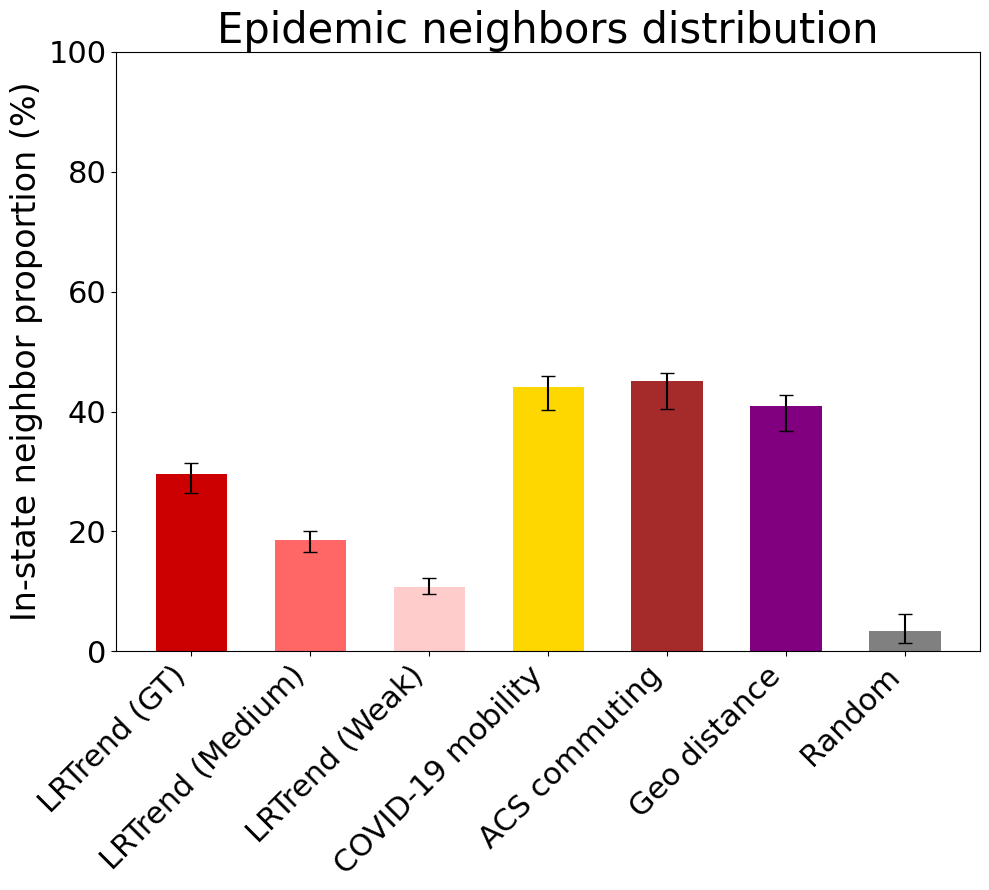

In [16]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from math import erf, sqrt

# ------- build table to plot (groups + matrices + chance) -------
group_defs = {
    'LRTrend (GT)':     GT_streams,
    'LRTrend (Medium)': medium_streams,
    'LRTrend (Weak)':   weak_streams,
}
plot_rows = []

# groups (mean across constituent streams)
for grp, streams in group_defs.items():
    sub = results_df[results_df['stream'].isin(streams)]
    plot_rows.append({
        'label': grp,
        'pct':   sub['in_state_pct'].mean(),
        'low':   sub['in_state_ci_low'].mean(),
        'high':  sub['in_state_ci_high'].mean()
    })

# three individual matrices
label_map = {
    'COVIDmatrix': 'COVID-19 mobility',
    'ACSmatrix':   'ACS commuting',
    'haversine':   'Geo distance'
}
for key, nice in label_map.items():
    row = results_df.loc[results_df.stream == key].iloc[0]
    plot_rows.append({
        'label': nice,
        'pct':   row.in_state_pct,
        'low':   row.in_state_ci_low,
        'high':  row.in_state_ci_high
    })

# chance baseline
plot_rows.append({
    'label': 'Random',
    'pct':   avg_random_in_state_pct,
    'low':   rand_ci_low,
    'high':  rand_ci_high
})

plot_df = pd.DataFrame(plot_rows)

# ---------- compute SEs from CIs (assume 95% => z=1.96) ----------
Z95 = 1.96
plot_df['se'] = ((plot_df['high'] - plot_df['low']) / 2.0) / Z95

# helper: standard normal CDF (no SciPy dependency)
def norm_cdf(z):
    return 0.5 * (1.0 + erf(z / sqrt(2.0)))

def one_sided_p_less(mean_a, se_a, mean_b, se_b):
    """p-value for H1: mean_a < mean_b"""
    diff = mean_a - mean_b
    se = np.hypot(se_a, se_b)  # sqrt(se_a^2 + se_b^2)
    if se == 0 or np.isnan(se):
        return np.nan
    z = diff / se
    return norm_cdf(z), z

def one_sided_p_greater(mean_a, se_a, mean_b, se_b):
    """p-value for H1: mean_a > mean_b"""
    diff = mean_a - mean_b
    se = np.hypot(se_a, se_b)
    if se == 0 or np.isnan(se):
        return np.nan
    z = diff / se
    return 1.0 - norm_cdf(z), z

# ---------- assemble p-values ----------
lrtrend_labels = ['LRTrend (GT)', 'LRTrend (Medium)', 'LRTrend (Weak)']
comparators_lt = ['COVID-19 mobility', 'ACS commuting', 'Geo distance']
random_label = 'Random'

rows = []
for lr in lrtrend_labels:
    mA = float(plot_df.loc[plot_df['label'] == lr, 'pct'])
    seA = float(plot_df.loc[plot_df['label'] == lr, 'se'])

    # LRTrend < mobility/commuting/distance (one-sided)
    for comp in comparators_lt:
        mB = float(plot_df.loc[plot_df['label'] == comp, 'pct'])
        seB = float(plot_df.loc[plot_df['label'] == comp, 'se'])
        p, z = one_sided_p_less(mA, seA, mB, seB)
        rows.append({
            'group': lr,
            'comparison': f"{lr} < {comp}",
            'z': z,
            'p_value': p
        })

    # LRTrend > random (one-sided)
    mR = float(plot_df.loc[plot_df['label'] == random_label, 'pct'])
    seR = float(plot_df.loc[plot_df['label'] == random_label, 'se'])
    pR, zR = one_sided_p_greater(mA, seA, mR, seR)
    rows.append({
        'group': lr,
        'comparison': f"{lr} > {random_label}",
        'z': zR,
        'p_value': pR
    })

pvals_df = pd.DataFrame(rows)
# Optional: print or save
print(pvals_df.to_string(index=False))
# pvals_df.to_csv("neighbors_pvalues.csv", index=False)

# ---------------- plot ----------------
x_pos   = np.arange(len(plot_df))
err_low = plot_df['pct'] - plot_df['low']
err_high= plot_df['high'] - plot_df['pct']
y_err   = [err_low, err_high]

# define custom colors:
#   first 3 = shades of red,
#   next 3 = orange, lightblue, lightgreen,
#   last = grey
colors = [
    '#cc0000',  # dark red
    '#ff6666',  # medium red
    '#ffcccc',  # light red
    'gold',
    'brown',
    'purple',
    'grey'
]

plt.figure(figsize=(10, 9))
plt.bar(
    x_pos,
    plot_df['pct'],
    yerr=y_err,
    color=colors,
    capsize=5,
    width=0.6,
    error_kw=dict(lw=1.5)
)
plt.yticks(fontsize=22)
plt.xticks(x_pos, plot_df['label'], rotation=45, fontsize=22, ha='right')
plt.ylabel("In-state neighbor proportion (%)", fontsize=24)
plt.title("Epidemic neighbors distribution", fontsize=30)
plt.ylim(0, 100)

plt.tight_layout()
plt.savefig("neighbors_distribution_with_CIs.png", dpi=300)
plt.show()


/tmp/ipykernel_19003/551223345.py:131: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  reds = mpl.cm.get_cmap('Reds')


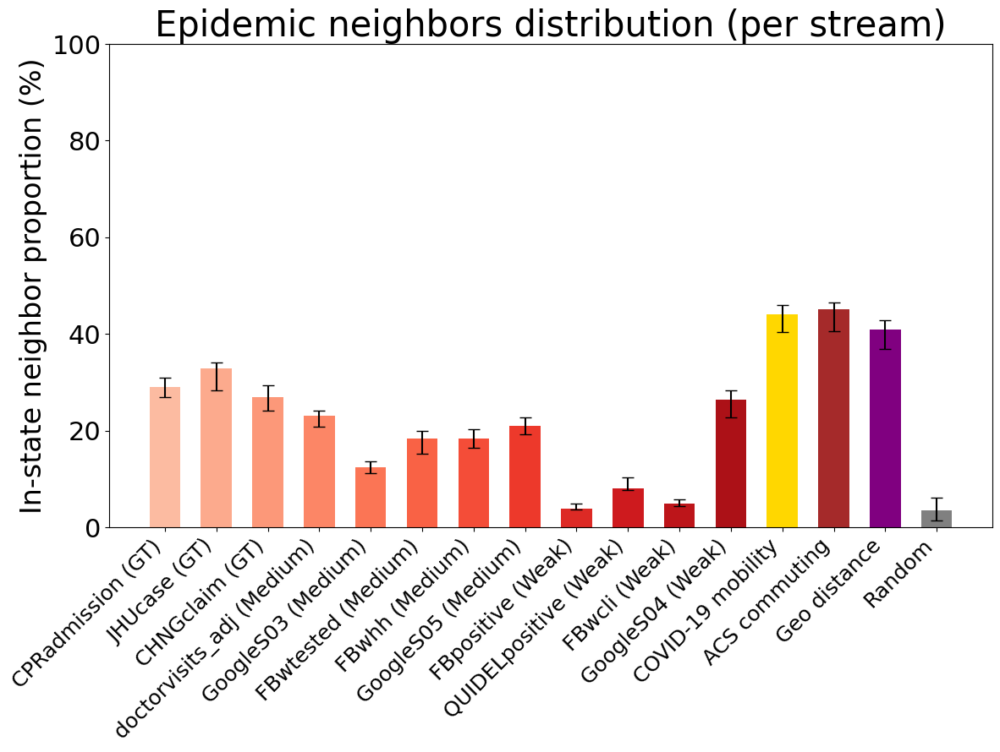

In [17]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from math import erf, sqrt
import matplotlib as mpl

# ------- build table to plot (individual streams + matrices + chance) -------
# Order streams as GT → Medium → Weak (exact list orders), then the 3 matrices, then Random.
all_streams_ordered = GT_streams + medium_streams + weak_streams

# nice suffix so you can still see which group a stream came from
suffix_map = {}
suffix_map.update({s: " (GT)"     for s in GT_streams})
suffix_map.update({s: " (Medium)" for s in medium_streams})
suffix_map.update({s: " (Weak)"   for s in weak_streams})

plot_rows = []

# individual LRTrend stream rows
for s in all_streams_ordered:
    sub = results_df.loc[results_df.stream == s]
    if len(sub) == 0:
        continue  # skip if not present
    row = sub.iloc[0]
    plot_rows.append({
        'label': f"{s}{suffix_map.get(s,'')}",
        'pct':   row.in_state_pct,
        'low':   row.in_state_ci_low,
        'high':  row.in_state_ci_high
    })

# three individual matrices
label_map = {
    'COVIDmatrix': 'COVID-19 mobility',
    'ACSmatrix':   'ACS commuting',
    'haversine':   'Geo distance'
}
for key, nice in label_map.items():
    sub = results_df.loc[results_df.stream == key]
    if len(sub) == 0:
        continue
    row = sub.iloc[0]
    plot_rows.append({
        'label': nice,
        'pct':   row.in_state_pct,
        'low':   row.in_state_ci_low,
        'high':  row.in_state_ci_high
    })

# chance baseline
plot_rows.append({
    'label': 'Random',
    'pct':   avg_random_in_state_pct,
    'low':   rand_ci_low,
    'high':  rand_ci_high
})

plot_df = pd.DataFrame(plot_rows)

# ---------- compute SEs from CIs (assume 95% => z=1.96) ----------
Z95 = 1.96
plot_df['se'] = ((plot_df['high'] - plot_df['low']) / 2.0) / Z95

# helper: standard normal CDF (no SciPy dependency)
def norm_cdf(z):
    return 0.5 * (1.0 + erf(z / sqrt(2.0)))

def one_sided_p_less(mean_a, se_a, mean_b, se_b):
    """p-value for H1: mean_a < mean_b"""
    diff = mean_a - mean_b
    se = np.hypot(se_a, se_b)  # sqrt(se_a^2 + se_b^2)
    if se == 0 or np.isnan(se):
        return np.nan, np.nan
    z = diff / se
    return norm_cdf(z), z

def one_sided_p_greater(mean_a, se_a, mean_b, se_b):
    """p-value for H1: mean_a > mean_b"""
    diff = mean_a - mean_b
    se = np.hypot(se_a, se_b)
    if se == 0 or np.isnan(se):
        return np.nan, np.nan
    z = diff / se
    return 1.0 - norm_cdf(z), z

# ---------- assemble p-values (each stream vs. matrices and Random) ----------
stream_labels = [f"{s}{suffix_map.get(s,'')}" for s in all_streams_ordered if f"{s}{suffix_map.get(s,'')}" in set(plot_df['label'])]
comparators_lt = ['COVID-19 mobility', 'ACS commuting', 'Geo distance']
random_label = 'Random'

rows = []
for lab in stream_labels:
    mA  = float(plot_df.loc[plot_df['label'] == lab, 'pct'])
    seA = float(plot_df.loc[plot_df['label'] == lab, 'se'])

    # LRTrend(stream) < mobility/commuting/distance (one-sided)
    for comp in comparators_lt:
        if comp not in set(plot_df['label']):
            continue
        mB  = float(plot_df.loc[plot_df['label'] == comp, 'pct'])
        seB = float(plot_df.loc[plot_df['label'] == comp, 'se'])
        p, z = one_sided_p_less(mA, seA, mB, seB)
        rows.append({
            'stream': lab,
            'comparison': f"{lab} < {comp}",
            'z': z,
            'p_value': p
        })

    # LRTrend(stream) > random (one-sided)
    mR  = float(plot_df.loc[plot_df['label'] == random_label, 'pct'])
    seR = float(plot_df.loc[plot_df['label'] == random_label, 'se'])
    pR, zR = one_sided_p_greater(mA, seA, mR, seR)
    rows.append({
        'stream': lab,
        'comparison': f"{lab} > {random_label}",
        'z': zR,
        'p_value': pR
    })

pvals_df = pd.DataFrame(rows)
# Optional: inspect or save
# print(pvals_df.to_string(index=False))
# pvals_df.to_csv("neighbors_pvalues_per_stream.csv", index=False)

# ---------------- colors ----------------
#   - First N_streams bars (all LRTrend streams) = red shades (dark→light)
#   - Next 3 = gold, brown, purple (matrices)
#   - Last = grey (Random)
n_streams = len(stream_labels)
reds = mpl.cm.get_cmap('Reds')
# choose a pleasant dark→light range avoiding extremes
red_shades = [reds(0.25 + 0.60 * (i / max(1, n_streams-1))) for i in range(n_streams)]

# Build full color list in the exact x order of plot_df
# Figure out where the matrices and random landed in plot_df
label_list = list(plot_df['label'])
colors = []
for lab in label_list:
    if lab in stream_labels:
        # pick next red shade in order of stream_labels
        idx = stream_labels.index(lab)
        colors.append(red_shades[idx])
    elif lab == 'COVID-19 mobility':
        colors.append('gold')
    elif lab == 'ACS commuting':
        colors.append('brown')
    elif lab == 'Geo distance':
        colors.append('purple')
    else:  # Random or anything else
        colors.append('grey')

# ---------------- plot ----------------
x_pos   = np.arange(len(plot_df))
err_low = plot_df['pct'] - plot_df['low']
err_high= plot_df['high'] - plot_df['pct']
y_err   = [err_low, err_high]

plt.figure(figsize=(12, 9))
plt.bar(
    x_pos,
    plot_df['pct'],
    yerr=y_err,
    color=colors,
    capsize=5,
    width=0.6,
    error_kw=dict(lw=1.5)
)
plt.yticks(fontsize=22)
plt.xticks(x_pos, plot_df['label'], rotation=45, fontsize=18, ha='right')
plt.ylabel("In-state neighbor proportion (%)", fontsize=24)
plt.title("Epidemic neighbors distribution (per stream)", fontsize=30)
plt.ylim(0, 100)

plt.tight_layout()
plt.savefig("neighbors_distribution_per_stream_with_CIs.png", dpi=300)
plt.show()


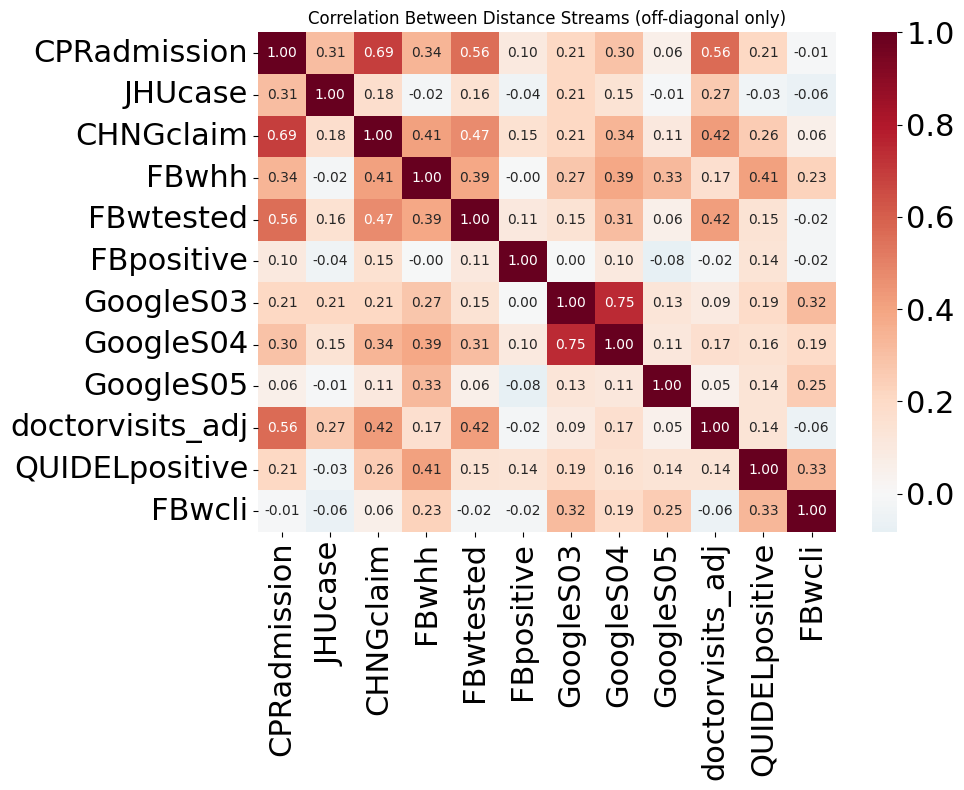

In [18]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# Step 1: Load all matrices and identify shared HRRs
all_distances = {}
shared_hrrs = None

for stream in data_streams:
    distances = pd.read_csv(f'dist_csvs/csv/{stream}_3NN_35.csv', index_col=0)
    distances.index = distances.columns  # ensure symmetry
    all_distances[stream] = distances

    hrrs = set(distances.index)
    shared_hrrs = hrrs if shared_hrrs is None else shared_hrrs & hrrs

shared_hrrs = sorted(shared_hrrs)

# Step 2: Flatten & drop inf’s
vectors = {}
for stream in data_streams:
    mat = all_distances[stream].loc[shared_hrrs, shared_hrrs].values
    flat = mat.flatten(order='C')            # row-major order
    finite_vals = flat[np.isfinite(flat)]    # drop inf (the diagonal)
    vectors[stream] = finite_vals

# Step 3: Build DataFrame and z-score each stream
vector_df = pd.DataFrame(vectors)
vector_df = (vector_df - vector_df.mean()) / vector_df.std()

# Step 4: Correlate & plot
corr = vector_df.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='RdBu_r', center=0, fmt=".2f")
plt.title('Correlation Between Distance Streams (off-diagonal only)')
plt.tight_layout()
plt.show()


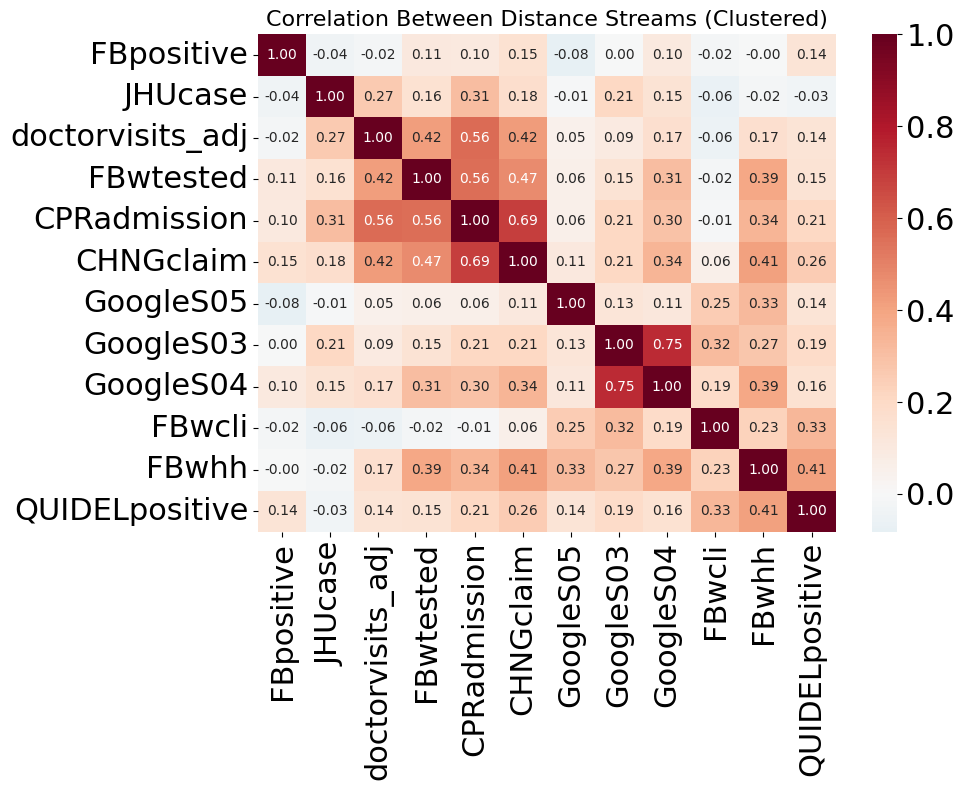

In [19]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import linkage, leaves_list
from scipy.spatial.distance import squareform

# (Same code up to correlation matrix)
# Step 1–3 omitted for brevity...

# Step 4: Correlate
corr = vector_df.corr()

# Step 5: Cluster rows/columns with linkage
# Convert correlation to distance (1 - corr)
dist = 1 - corr

# Use linkage and get optimal leaf ordering
linkage_rows = linkage(squareform(dist), method='average')
linkage_cols = linkage(squareform(dist.T), method='average')

# Get reordered indices
row_order = leaves_list(linkage_rows)
col_order = leaves_list(linkage_cols)

# Reorder the matrix
corr_reordered = corr.iloc[row_order, :].iloc[:, col_order]

# Step 6: Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_reordered, annot=True, cmap='RdBu_r', center=0, fmt=".2f",
            xticklabels=corr_reordered.columns, yticklabels=corr_reordered.index)
plt.title('Correlation Between Distance Streams (Clustered)', fontsize=16)
plt.tight_layout()
plt.savefig('correlation_clustered_manual.png', dpi=300)
plt.show()


In [31]:
import sys
sys.executable

'/home/aturcan/miniconda3/envs/scdrs6/bin/python'

In [40]:
!/home/aturcan/miniconda3/envs/scdrs6/bin/python -m pip install --upgrade nbformat

  Using cached nbformat-5.10.4-py3-none-any.whl.metadata (3.6 kB)
  Using cached fastjsonschema-2.21.1-py3-none-any.whl.metadata (2.2 kB)
Using cached nbformat-5.10.4-py3-none-any.whl (78 kB)
Using cached fastjsonschema-2.21.1-py3-none-any.whl (23 kB)


In [36]:
from geopy.geocoders import Nominatim
import time

geolocator = Nominatim(user_agent="hrr_geocoder")

def get_lat_lon(name):
    try:
        location = geolocator.geocode(name + ", USA")
        print(location)
        if location:
            latlon = pd.Series([location.latitude, location.longitude])
            print(latlon)
            return latlon
    except:
        return pd.Series([None, None])
    return pd.Series([None, None])

# Geocode HRR names
hrr_map[['lat', 'lon']] = hrr_map['hrrname'].apply(get_lat_lon)
time.sleep(0.1)  # be nice to Nominatim


Murphy USA, 121, Roebuck Plaza Drive, Roebuck, Birmingham, Jefferson County, Alabama, 35206, United States
0    33.588156
1   -86.701380
dtype: float64
Murphy USA, 3070, South Oates Street, Mullins, Dothan, Houston County, Alabama, 36301, United States
0    31.177703
1   -85.402730
dtype: float64
Mazda Toyota Manufacturing USA, Huntsville, Limestone County, Alabama, United States
0    34.681631
1   -86.845696
dtype: float64
University of South Alabama, 307, North University Boulevard, Mobile City Council District 7, Mobile, Mobile County, Alabama, 36688, United States
0    30.697241
1   -88.189233
dtype: float64
Tuscaloosa Street, Greensboro, Hale County, Alabama, 36744, United States
0    32.713755
1   -87.595928
dtype: float64
Swissport USA Inc, West 50th Avenue, Anchorage, Alaska, 99530, United States
0     61.175390
1   -149.966924
dtype: float64
SWIMkids USA, 2725, West Guadalupe Road, Mesa, Maricopa County, Arizona, 85202, United States
0     33.363471
1   -111.893070
dtype: floa

Springfield Street, Cabotville Industrial Park, Sandy Hill, Chicopee, Hampden County, Massachusetts, 01013, United States
0    42.149603
1   -72.607825
dtype: float64
Autobahn USA, 88, Turnpike Road, Westborough, Worcester County, Massachusetts, 01581, United States
0    42.286353
1   -71.595028
dtype: float64
AW Technical Center USA, 1203, Woodridge Avenue, Ann Arbor, Washtenaw County, Michigan, 48105, United States
0    42.291948
1   -83.676347
dtype: float64
Martial Arts USA, Michigan Avenue, Southwestern Outer Drive, Dearborn, Wayne County, Michigan, 48128, United States
0    42.300396
1   -83.270547
dtype: float64
Motown Museum, 2648, West Grand Boulevard, Henry Ford, New Center, Detroit, Wayne County, Michigan, 48200, United States
0    42.364122
1   -83.088492
dtype: float64
None
USA Tae Kwon Do, 125, Peekstok Road, Kalamazoo, Kalamazoo County, Michigan, 49001, United States
0    42.253628
1   -85.579056
dtype: float64
USA 2 GO, 2770, Eaton Rapids Road, Lansing, Ingham County, M

Beavex USA LLC, 1200, Westinghouse Boulevard, Charlotte, Mecklenburg County, North Carolina, 28273, United States
0    35.119795
1   -80.931396
dtype: float64
Murphy USA, 1039, Martin Luther King Jr Parkway, Durham, Durham County, North Carolina, 27707, United States
0    35.949549
1   -78.926378
dtype: float64
Skateland USA West, 200, Stage Coach Trail, Greensboro, Guilford County, North Carolina, 27409, United States
0    36.079620
1   -79.912127
dtype: float64
Greenville Boulevard Northeast, Greenville, Pitt County, North Carolina, 27858, United States
0    35.617671
1   -77.328835
dtype: float64
Grasche USA, 240, Performance Drive Southeast, Hickory, Catawba County, North Carolina, 28602, United States
0    35.728097
1   -81.282871
dtype: float64
Murphy USA, Sigmon Road, College Acres, Wilmington, New Hanover County, North Carolina, 28405, United States
0    34.244152
1   -77.875880
dtype: float64
Winston-Salem, Forsyth County, North Carolina, United States
0    36.099813
1   -80.2

Murphy USA, 5732, West Amarillo Boulevard, Amarillo, Potter County, Texas, 79106, United States
0     35.211928
1   -101.903168
dtype: float64
Murphy USA, West Slaughter Lane, South Bend, Austin, Travis County, Texas, 78715, United States
0    30.166608
1   -97.789011
dtype: float64
Murphy USA, Old Dowlen Road, Beaumont, Jefferson County, Texas, 77708, United States
0    30.120911
1   -94.167739
dtype: float64
Murphy USA, 2200, Briarcrest Drive, Bryan, Brazos County, Texas, 77802, United States
0    30.659295
1   -96.331125
dtype: float64
Storage King USA, South Padre Island Drive Frontage Road, Corpus Christi, Nueces County, Texas, 78412, United States
0    27.684755
1   -97.325270
dtype: float64
Buzzi Unicem USA - Dallas Distribution Terminal, Dallas, Dallas County, Texas, United States
0    32.774805
1   -96.860811
dtype: float64
Murphy USA, 10655, Gateway Boulevard West, El Paso, El Paso County, Texas, 79935, United States
0     31.751957
1   -106.342557
dtype: float64
Murphy Oil U

In [43]:
hrr_map.to_csv('hrr_map.csv')


In [20]:
import pandas as pd

hrr_map = pd.read_csv('hrr_map.csv', index_col=0)
hrr_map

,hrr,hrrname,hrrstate,lat,lon
1,1,AL- BIRMINGHAM,AL,33.588156,-86.701380
5,2,AL- DOTHAN,AL,31.177703,-85.402730
36,5,AL- HUNTSVILLE,AL,34.681631,-86.845696
3,6,AL- MOBILE,AL,30.697241,-88.189233
2,7,AL- MONTGOMERY,AL,NaN,NaN
...,...,...,...,...,...
4499,450,WI- MARSHFIELD,WI,44.632291,-90.216422
950,451,WI- MILWAUKEE,WI,43.029881,-87.920126
4514,452,WI- NEENAH,WI,44.181301,-88.467696
1837,456,WI- WAUSAU,WI,44.974015,-89.608506


In [23]:
import pandas as pd
from sklearn.cluster import KMeans
import plotly.express as px
import plotly.io as pio
pio.renderers.default = 'notebook'

# 1) Load distances
distances = pd.read_csv('dist_csvs/csv/GoogleS04_3NN_35.csv', index_col=0)
distances.index = distances.columns.astype(str)

# 2) Transform distances: -1 * dist then 1 / dist
with pd.option_context('mode.use_inf_as_na', True):
    transformed = -1 * distances
    transformed = 1 / transformed
    transformed = transformed.fillna(0)

# 3) Use transformed distance matrix as features (each HRR is a row vector)
feature_matrix = transformed.values

# 4) Apply KMeans clustering
kmeans = KMeans(n_clusters=10, random_state=42, n_init='auto')
labels = kmeans.fit_predict(feature_matrix)

# 5) Map HRRs to clusters
df = pd.DataFrame({
    'hrr': transformed.index,
    'cluster': labels
})
df['state'] = df['hrr'].map(hrr2state)  # assumes hrr2state is defined

# 6) Majority cluster per state
state_cluster = (
    df.groupby('state')['cluster']
      .agg(lambda s: s.value_counts().idxmax())
      .reset_index()
)

# 7) Choropleth map
fig = px.choropleth(
    state_cluster,
    locations='state',
    locationmode='USA-states',
    color='cluster',
    scope='usa',
    title='K-Means Clustering by State (CPRadmission, Transformed Distances)'
)
fig.show()


In [24]:
# 5) Map HRRs to clusters (renamed to cluster_df to match merge code)
cluster_df = pd.DataFrame({
    'hrr': transformed.index,
    'cluster': labels
})
cluster_df['hrr'] = cluster_df['hrr'].astype(int)  # Ensure hrr is int

# Ensure hrr_map uses int as well
hrr_map['hrr'] = hrr_map['hrr'].astype(int)

# Merge with geo info
hrr_with_geo = pd.merge(hrr_map, cluster_df, on='hrr', how='inner')


In [25]:
pd.set_option('display.max_rows', None)
hrr_with_geo

,hrr,hrrname,hrrstate,lat,lon,cluster
0,1,AL- BIRMINGHAM,AL,33.588156,-86.701380,8
1,2,AL- DOTHAN,AL,31.177703,-85.402730,8
2,5,AL- HUNTSVILLE,AL,34.681631,-86.845696,9
3,6,AL- MOBILE,AL,30.697241,-88.189233,8
4,7,AL- MONTGOMERY,AL,NaN,NaN,8
5,9,AL- TUSCALOOSA,AL,32.713755,-87.595928,8
6,10,AK- ANCHORAGE,AK,61.175390,-149.966924,1
7,11,AZ- MESA,AZ,33.363471,-111.893070,8
8,12,AZ- PHOENIX,AZ,33.665805,-111.973625,8
9,14,AZ- SUN CITY,AZ,33.565226,-112.288232,8


In [26]:
import plotly.express as px

fig = px.scatter_geo(
    hrr_with_geo,
    lat='lat',
    lon='lon',
    color='cluster',
    hover_name='hrrname',
    scope='usa',
    title='HRR-level Leiden Clustering (dots on cities)',
    projection='albers usa'
)
fig.show()


In [27]:
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px

# Load distances
distances = pd.read_csv('dist_csvs/csv/GoogleS04_3NN_35.csv', index_col=0)
distances.index = distances.columns.astype(str)

# Prepare geo+cluster data (assume hrr_with_geo already exists)
hrr_with_geo['hrr'] = hrr_with_geo['hrr'].astype(str).str.zfill(3)

# CONUS filter
def is_contiguous(lat, lon):
    return pd.notnull(lat) and pd.notnull(lon) and (24 <= lat <= 50) and (-125 <= lon <= -66)

valid_hrrs = hrr_with_geo[
    hrr_with_geo.apply(lambda row: is_contiguous(row['lat'], row['lon']), axis=1)
]['hrr'].values

# Build 3-NN edge list
edges = []
for hrr in distances.index:
    if hrr not in valid_hrrs:
        continue
    row = distances.loc[hrr].drop(hrr)
    for nbr in row.nsmallest(3).index:
        if nbr in valid_hrrs:
            edges.append((hrr, nbr))

# Choose a diverse discrete palette
palette = [
    "#1f77b4",  # blue
    "#ff7f0e",  # orange
    "#2ca02c",  # green
    "#d62728",  # red
    "#9467bd",  # purple
    "#8c564b",  # brown
    "#e377c2",  # pink
    "#7f7f7f",  # gray
    "#bcbd22",  # yellow-green
    "#17becf"   # teal
]

# Create figure
fig = go.Figure()

# 1) Draw all edges as a single trace (with legend)
line_lat = []
line_lon = []
for h1, h2 in edges:
    p1 = hrr_with_geo[hrr_with_geo['hrr'] == h1]
    p2 = hrr_with_geo[hrr_with_geo['hrr'] == h2]
    if p1.empty or p2.empty:
        continue
    lat1, lon1 = p1['lat'].iat[0], p1['lon'].iat[0]
    lat2, lon2 = p2['lat'].iat[0], p2['lon'].iat[0]
    line_lat += [lat1, lat2, None]
    line_lon += [lon1, lon2, None]

fig.add_trace(go.Scattergeo(
    lat=line_lat,
    lon=line_lon,
    mode='lines',
    line=dict(width=0.5, color='black'),
    opacity=0.4,
    name='Epidemic neighbor',  # ✅ line label
    hoverinfo='skip',
    showlegend=True
))

# 2) Draw cluster-labeled dots with black outline
dots = hrr_with_geo[hrr_with_geo['hrr'].isin(valid_hrrs)]
clusters = sorted(dots['cluster'].unique())
for c in clusters:
    sub = dots[dots['cluster'] == c]
    color = palette[c % len(palette)]
    fig.add_trace(go.Scattergeo(
        lon=sub['lon'],
        lat=sub['lat'],
        text=sub['hrrname'],
        mode='markers',
        marker=dict(
            size=12,
            color=color,
            line=dict(width=1, color='black')
        ),
        name=f'Cluster {c}',     # ✅ one trace per cluster
        hoverinfo='text',
        showlegend=True
    ))

# Layout
fig.update_layout(
    title='HRR 3-Nearest-Neighbor Graph (Contiguous US only)',
    geo=dict(
        scope='usa',
        projection_type='albers usa',
        showland=True,
        landcolor='lightgray'
    ),
    margin=dict(l=0, r=0, t=50, b=0),
    legend=dict(
        font=dict(size=20)  # 👈 increase legend font size
    )
)

fig.show()


In [28]:
import numpy as np
import pandas as pd

def haversine_km(lat1, lon1, lat2, lon2):
    R = 6371.0  # Earth radius in km
    φ1, λ1, φ2, λ2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dφ = φ2 - φ1
    dλ = λ2 - λ1
    a = np.sin(dφ/2.0)**2 + np.cos(φ1) * np.cos(φ2) * np.sin(dλ/2.0)**2
    return 2 * R * np.arcsin(np.sqrt(a))

line_lat = []
line_lon = []
edge_rows = []  # accumulate rows for df_edges

for h1, h2 in edges:
    p1 = hrr_with_geo[hrr_with_geo['hrr'] == h1]
    p2 = hrr_with_geo[hrr_with_geo['hrr'] == h2]
    if p1.empty or p2.empty:
        continue

    name1 = p1['hrrname'].iat[0]
    name2 = p2['hrrname'].iat[0]
    lat1, lon1 = p1['lat'].iat[0], p1['lon'].iat[0]
    lat2, lon2 = p2['lat'].iat[0], p2['lon'].iat[0]

    # accumulate line segments for plotting
    line_lat += [lat1, lat2, None]
    line_lon += [lon1, lon2, None]

    # compute distance
    d_km = float(haversine_km(lat1, lon1, lat2, lon2))
    d_mi = d_km * 0.621371

    # save edge record
    edge_rows.append({
        'hrr1': h1,
        'hrr2': h2,
        'name1': name1,
        'name2': name2,
        'lat1': lat1,
        'lon1': lon1,
        'lat2': lat2,
        'lon2': lon2,
        'distance_km': d_km,
        'distance_mi': d_mi
    })

    print(name1, name2)

# Final DataFrame of edges and distances
df_edges = pd.DataFrame(edge_rows)


AL- BIRMINGHAM AZ- PHOENIX
AL- BIRMINGHAM AZ- MESA
AL- BIRMINGHAM AZ- SUN CITY
AL- DOTHAN TX- CORPUS CHRISTI
AL- DOTHAN FL- PENSACOLA
AL- DOTHAN AL- BIRMINGHAM
AL- HUNTSVILLE AL- BIRMINGHAM
AL- HUNTSVILLE TN- CHATTANOOGA
AL- HUNTSVILLE AZ- PHOENIX
AL- MOBILE FL- PENSACOLA
AL- MOBILE FL- FORT MYERS
AL- TUSCALOOSA NC- WILMINGTON
AL- TUSCALOOSA SC- CHARLESTON
AR- FORT SMITH OK- TULSA
AR- FORT SMITH AZ- PHOENIX
AR- FORT SMITH AZ- MESA
AR- JONESBORO TX- HOUSTON
AR- JONESBORO OK- OKLAHOMA CITY
AR- JONESBORO AZ- PHOENIX
AR- LITTLE ROCK TX- TEMPLE
AR- LITTLE ROCK OK- TULSA
AR- SPRINGDALE IN- INDIANAPOLIS
AR- SPRINGDALE MO- KANSAS CITY
AR- SPRINGDALE KY- LOUISVILLE
AR- TEXARKANA CA- STOCKTON
AR- TEXARKANA CA- BAKERSFIELD
AR- TEXARKANA SC- CHARLESTON
AZ- MESA AZ- PHOENIX
AZ- MESA AZ- SUN CITY
AZ- MESA AZ- TUCSON
AZ- PHOENIX AZ- SUN CITY
AZ- PHOENIX AZ- MESA
AZ- PHOENIX AZ- TUCSON
AZ- SUN CITY AZ- PHOENIX
AZ- SUN CITY AZ- MESA
AZ- SUN CITY AZ- TUCSON
AZ- TUCSON AZ- PHOENIX
AZ- TUCSON AZ- SUN CITY

In [29]:
top50_cities = [
    "NY- NEW YORK",
    "CA- LOS ANGELES",
    "IL- CHICAGO",
    "TX- HOUSTON",
    "AZ- PHOENIX",
    "PA- PHILADELPHIA",
    "TX- SAN ANTONIO",
    "CA- SAN DIEGO",
    "TX- DALLAS",
    "CA- SAN JOSE",
    "TX- AUSTIN",
    "FL- JACKSONVILLE",
    "TX- FORT WORTH",
    "OH- COLUMBUS",
    "IN- INDIANAPOLIS",
    "NC- CHARLOTTE",
    "CA- SAN FRANCISCO",
    "WA- SEATTLE",
    "CO- DENVER",
    "DC- WASHINGTON",
    "MA- BOSTON",
    "TN- NASHVILLE",
    "OK- OKLAHOMA CITY",
    "MI- DETROIT",
    "OR- PORTLAND",
    "NV- LAS VEGAS",
    "TN- MEMPHIS",
    "KY- LOUISVILLE",
    "MD- BALTIMORE",
    "WI- MILWAUKEE",
    "NM- ALBUQUERQUE",
    "AZ- TUCSON",
    "CA- FRESNO",
    "CA- SACRAMENTO",
    "MO- KANSAS CITY",
    "GA- ATLANTA",
    "CA- LONG BEACH",
    "CO- COLORADO SPRINGS",
    "NC- RALEIGH",
    "FL- MIAMI",
    "VA- VIRGINIA BEACH",
    "NE- OMAHA",
    "CA- OAKLAND",
    "MN- MINNEAPOLIS",
    "OK- TULSA",
    "KS- WICHITA",
    "TX- ARLINGTON",
    "FL- TAMPA",
    "LA- NEW ORLEANS",
    "KS- BAKERSFIELD"
]


In [30]:
len(edges)

617

Proportion of major-city edges connected to another major city: 0.19923371647509577
Proportion of major-city edges within 150 miles: 0.41379310344827586
Proportion of major-city edges that are neither: 0.38697318007662834

Non-major city edges within 150 miles: 133 out of 356 (37.36%)

--- Summary stats and top 10 edges by distance ---

All edges:
  Median = 211.17, Q25 = 89.13, Q75 = 543.43
  Top 10 edges by distance:
    OR- MEDFORD ↔ FL- FORT MYERS : 2546.94 mi
    OR- MEDFORD ↔ FL- HUDSON : 2433.89 mi
    CA- CHICO ↔ NC- GREENVILLE : 2424.44 mi
    WA- OLYMPIA ↔ PA- HARRISBURG : 2315.52 mi
    LA- MONROE ↔ AZ- MESA : 2205.97 mi
    CA- CHICO ↔ SC- GREENVILLE : 2181.43 mi
    VA- LYNCHBURG ↔ WA- SPOKANE : 2049.07 mi
    WA- YAKIMA ↔ WV- CHARLESTON : 2018.88 mi
    WA- SPOKANE ↔ NC- ASHEVILLE : 1972.16 mi
    CA- SANTA BARBARA ↔ KY- LOUISVILLE : 1924.56 mi

Major cities:
  Median = 192.05, Q25 = 99.52, Q75 = 501.52
  Top 10 edges by distance:
    CA- SANTA BARBARA ↔ KY- LOUISVILLE : 

/tmp/ipykernel_19003/3923544406.py:56: MatplotlibDeprecationWarning:

The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.



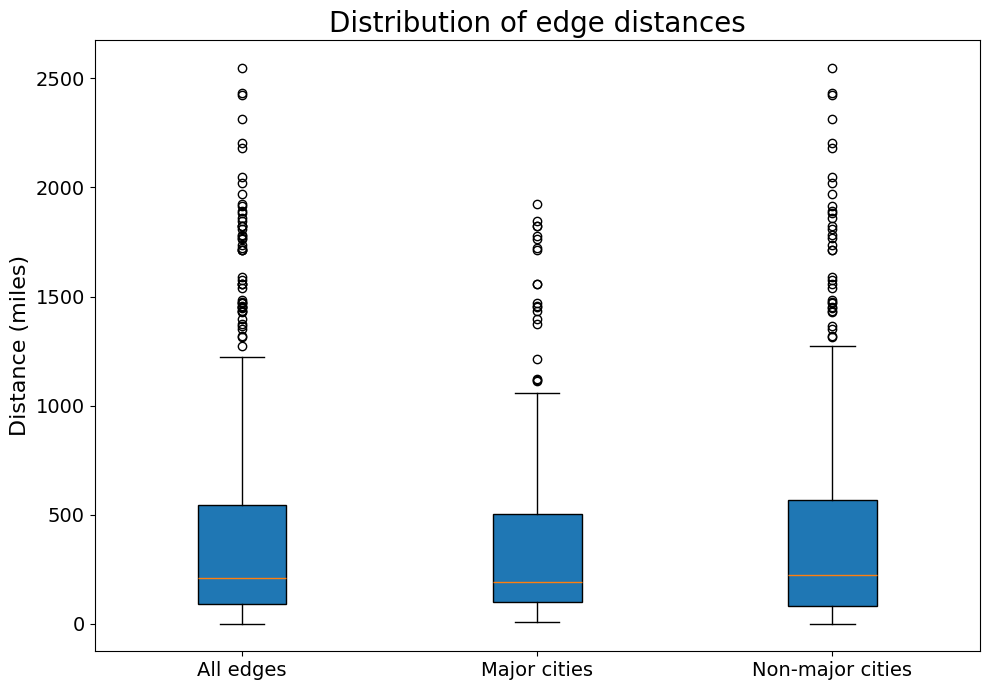

In [31]:
import matplotlib.pyplot as plt

# ---- Step 2. Flag edges that involve major cities ----
df_edges['major1'] = df_edges['name1'].isin(top50_cities)
df_edges['major2'] = df_edges['name2'].isin(top50_cities)
df_edges['any_major'] = df_edges['major1'] | df_edges['major2']
df_edges['both_major'] = df_edges['major1'] & df_edges['major2']

# ---- Step 3. Proportions for edges with at least one major city ----
subset = df_edges[df_edges['any_major']]

prop_connected_to_major = (subset['both_major'].sum() / len(subset)) if len(subset) else 0
prop_within_150_miles = (subset['distance_mi'] <= 150).mean() if len(subset) else 0
prop_neither = 1 - max(prop_connected_to_major, 0) - max(prop_within_150_miles, 0)

print("Proportion of major-city edges connected to another major city:", prop_connected_to_major)
print("Proportion of major-city edges within 150 miles:", prop_within_150_miles)
print("Proportion of major-city edges that are neither:", prop_neither)

# ---- Step 3.5. Count non-major edges within 150 miles ----
nonmajor_subset = df_edges.loc[~df_edges['any_major']]
nonmajor_within_150 = int((nonmajor_subset['distance_mi'] <= 150).sum())
total_nonmajor = len(nonmajor_subset)
pct_nonmajor_within_150 = (nonmajor_within_150 / total_nonmajor) if total_nonmajor else 0
print(f"\nNon-major city edges within 150 miles: {nonmajor_within_150} out of {total_nonmajor} "
      f"({pct_nonmajor_within_150:.2%})")

# ---- Step 4. Prepare data for boxplots ----
all_distances = df_edges['distance_mi']
major_distances = subset['distance_mi']
nonmajor_distances = nonmajor_subset['distance_mi']

groups = {
    "All edges": df_edges,
    "Major cities": subset,
    "Non-major cities": nonmajor_subset
}

print("\n--- Summary stats and top 10 edges by distance ---")
for name, df in groups.items():
    if len(df) == 0:
        print(f"{name}: No data")
        continue
    median = df['distance_mi'].median()
    q25 = df['distance_mi'].quantile(0.25)
    q75 = df['distance_mi'].quantile(0.75)
    print(f"\n{name}:")
    print(f"  Median = {median:.2f}, Q25 = {q25:.2f}, Q75 = {q75:.2f}")
    print("  Top 10 edges by distance:")
    top10 = df.sort_values('distance_mi', ascending=False).head(10)
    for _, row in top10.iterrows():
        print(f"    {row['name1']} ↔ {row['name2']} : {row['distance_mi']:.2f} mi")

# ---- Step 5. Boxplot (all in one figure) ----
plt.figure(figsize=(10, 7))
plt.boxplot(
    [all_distances, major_distances, nonmajor_distances],
    labels=["All edges", "Major cities", "Non-major cities"],
    patch_artist=True
)
plt.ylabel("Distance (miles)", fontsize=16)
plt.title("Distribution of edge distances", fontsize=20)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()
plt.show()


In [32]:
df_edges[df_edges['name1'] == 'WA- SPOKANE']

,hrr1,hrr2,name1,name2,lat1,lon1,lat2,lon2,distance_km,distance_mi,major1,major2,any_major,both_major
577,440,015,WA- SPOKANE,AZ- TUCSON,47.625831,-117.500986,32.235927,-110.885916,1800.143230,1118.556799,False,True,True,False
578,440,344,WA- SPOKANE,OR- PORTLAND,47.625831,-117.500986,45.526193,-122.590332,453.545799,281.820207,False,True,True,False
579,440,309,WA- SPOKANE,NC- ASHEVILLE,47.625831,-117.500986,35.275817,-82.701513,3173.879622,1972.156754,False,False,False,False


In [33]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

# ── Configurable threshold ────────────────────────────────────────────────────
threshold = 0.8

# ── 1. Read power files ───────────────────────────────────────────────────────
ws_vals = list(range(5, 46, 2))                         # 5, 7, …, 45
powers = {}

for ws in ws_vals:
    df = pd.read_csv(
        f'../hrr_results/doctorvisits_{ws}.csv',
        names=['hrr', 'power'],
        header=None,
        skiprows=1
    )
    df['hrr'] = df['hrr'].astype(str).str.zfill(3)
    powers[ws] = df.set_index('hrr')['power']

powers_df = pd.DataFrame(powers)                        # rows = HRR

# ── 2. First ws with power > threshold (or NaN if never) ──────────────────────
def first_ws(row, thresh):
    for w in ws_vals:
        if row[w] > thresh:
            return w
    return np.nan

needed_ws = powers_df.apply(first_ws, axis=1, thresh=threshold).rename('min_ws')

# ── 3. Merge with geo info; keep only HRRs present in ws files ────────────────
hrr_with_geo['hrr'] = hrr_with_geo['hrr'].astype(str).str.zfill(3)
plot_df = (
    hrr_with_geo
    .merge(needed_ws, left_on='hrr', right_index=True, how='inner')
    .loc[lambda df: df['min_ws'].notna() | df['min_ws'].isna()]
)

# ── 4. Scatter plot ───────────────────────────────────────────────────────────
fig = go.Figure()

# 4a. HRRs that achieved ≥ threshold power
reached = plot_df[plot_df['min_ws'].notna()]
fig.add_trace(
    go.Scattergeo(
        lon=reached['lon'],
        lat=reached['lat'],
        text=reached['hrrname'] +
             '<br>min ws = ' + reached['min_ws'].astype(int).astype(str) +
             f'<br>to reach {threshold*100:.0f}% power',
        mode='markers',
        showlegend=False,
        marker=dict(
            size=20,
            color=reached['min_ws'],
            colorscale='RdYlGn_r',    # low = green (good), high = red (bad)
            cmin=min(ws_vals),
            cmax=max(ws_vals),
            colorbar=dict(title=f'Window size'),
            line=dict(color='black', width=1)
        ),
        hoverinfo='text'
    )
)

# 4b. HRRs that never reached threshold power
missed = plot_df[plot_df['min_ws'].isna()]
if not missed.empty:
    fig.add_trace(
        go.Scattergeo(
            lon=missed['lon'],
            lat=missed['lat'],
            text=missed['hrrname'] + f'<br>never ≥{threshold*100:.0f}% power',
            mode='markers',
            showlegend=False,
            marker=dict(
                size=20,
                color='black',
                line=dict(color='black', width=1)
            ),
            hoverinfo='text'
        )
    )

# ── 5. Layout ─────────────────────────────────────────────────────────────────
fig.update_layout(
    title=f'HRR window size required for ≥{threshold*100:.0f}% power (CPR admission)',
    geo=dict(
        scope='usa',
        projection_type='albers usa',
        showland=True,
        landcolor='lightgray'
    ),
    margin=dict(l=0, r=0, t=50, b=0)
)

fig.show()


In [34]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

# ── Configurable threshold ────────────────────────────────────────────────────
threshold = 0.8

# ── 1. Read power files ───────────────────────────────────────────────────────
ws_vals = list(range(5, 46, 2))                         # 5, 7, …, 45
powers = {}

for ws in ws_vals:
    df = pd.read_csv(
        f'../hrr_results/1_{ws}.csv',
        names=['hrr', 'power'],
        header=None,
        skiprows=1
    )
    df['hrr'] = df['hrr'].astype(str).str.zfill(3)
    powers[ws] = df.set_index('hrr')['power']

powers_df = pd.DataFrame(powers)                        # rows = HRR

# ── 2. First ws with power > threshold (or NaN if never) ──────────────────────
def first_ws(row, thresh):
    for w in ws_vals:
        if row[w] > thresh:
            return w
    return np.nan

needed_ws = powers_df.apply(first_ws, axis=1, thresh=threshold).rename('min_ws')

# ── 3. Merge with geo info; keep only HRRs present in ws files ────────────────
hrr_with_geo['hrr'] = hrr_with_geo['hrr'].astype(str).str.zfill(3)
plot_df = (
    hrr_with_geo
    .merge(needed_ws, left_on='hrr', right_index=True, how='inner')
    .loc[lambda df: df['min_ws'].notna() | df['min_ws'].isna()]
)

# ── 4. Scatter plot ───────────────────────────────────────────────────────────
fig = go.Figure()

# 4a. HRRs that achieved ≥ threshold power
reached = plot_df[plot_df['min_ws'].notna()]
fig.add_trace(
    go.Scattergeo(
        lon=reached['lon'],
        lat=reached['lat'],
        text=reached['hrrname'] +
             '<br>min ws = ' + reached['min_ws'].astype(int).astype(str) +
             f'<br>to reach {threshold*100:.0f}% power',
        mode='markers',
        showlegend=False,
        marker=dict(
            size=20,
            color=reached['min_ws'],
            colorscale='RdYlGn_r',    # low = green (good), high = red (bad)
            cmin=min(ws_vals),
            cmax=max(ws_vals),
            colorbar=dict(title=f'Window size'),
            line=dict(color='black', width=1)
        ),
        hoverinfo='text'
    )
)

# 4b. HRRs that never reached threshold power
missed = plot_df[plot_df['min_ws'].isna()]
if not missed.empty:
    fig.add_trace(
        go.Scattergeo(
            lon=missed['lon'],
            lat=missed['lat'],
            text=missed['hrrname'] + f'<br>never ≥{threshold*100:.0f}% power',
            mode='markers',
            showlegend=False,
            marker=dict(
                size=20,
                color='black',
                line=dict(color='black', width=1)
            ),
            hoverinfo='text'
        )
    )

# ── 5. Layout ─────────────────────────────────────────────────────────────────
fig.update_layout(
    title=f'HRR window size required for ≥{threshold*100:.0f}% power (CPR admission)',
    geo=dict(
        scope='usa',
        projection_type='albers usa',
        showland=True,
        landcolor='lightgray'
    ),
    margin=dict(l=0, r=0, t=50, b=0)
)

fig.show()


Variation by dataset (using sample variance, ddof=1):
      doctorvisits: variance = 85.3158 | std = 9.2367 | n = 91
         GoogleS05: variance = 46.8286 | std = 6.8431 | n = 91
             FBwhh: variance = 123.7158 | std = 11.1228 | n = 91
         FBwtested: variance = 110.4144 | std = 10.5078 | n = 91
         GoogleS03: variance = 54.1824 | std = 7.3609 | n = 91
   Combined Medium: variance = 39.6305 | std = 6.2953 | n = 91

One-sided F-tests (Var(Combined Medium) < Var(other)):
      doctorvisits: F = 0.4645, df=(90,90), p(one-sided) = 0.000169
         GoogleS05: F = 0.8463, df=(90,90), p(one-sided) = 0.215057
             FBwhh: F = 0.3203, df=(90,90), p(one-sided) = 0.000000
         FBwtested: F = 0.3589, df=(90,90), p(one-sided) = 0.000001
         GoogleS03: F = 0.7314, df=(90,90), p(one-sided) = 0.069914


/tmp/ipykernel_19003/2685264155.py:108: MatplotlibDeprecationWarning:

The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.



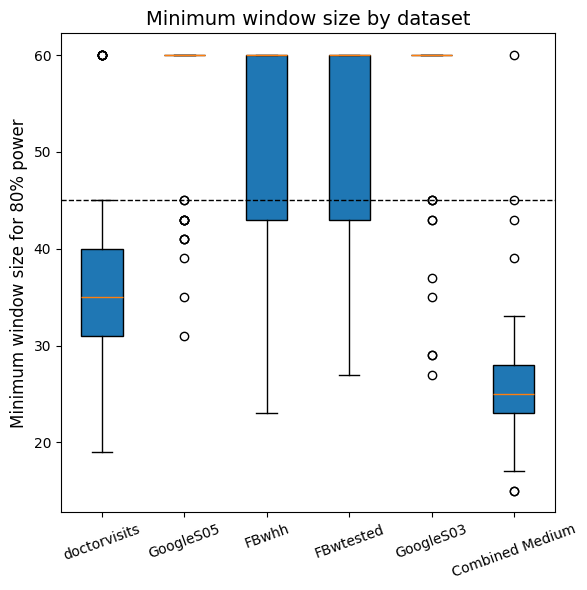

In [35]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

# ── Configurable display (font sizes) ─────────────────────────────────────────
TITLE_FS = 14
AXIS_LABEL_FS = 12
TICK_FS = 10

# ── Configurable threshold ────────────────────────────────────────────────────
threshold = 0.8

# ── Datasets to iterate (prefix replaces the "1" in filenames) ───────────────
datasets = ["doctorvisits", "GoogleS05", "FBwhh", "FBwtested", "GoogleS03", "1"]
label_map = {
    "doctorvisits": "doctorvisits",
    "GoogleS05": "GoogleS05",
    "FBwhh": "FBwhh",
    "FBwtested": "FBwtested",
    "GoogleS03": "GoogleS03",
    "1": "Combined Medium"
}

# ── Window sizes ─────────────────────────────────────────────────────────────
ws_vals = list(range(5, 46, 2))  # 5, 7, …, 45

def compute_min_ws_for_dataset(prefix: str, thresh: float) -> pd.Series:
    """Return Series of min_ws (indexed by HRR) for a given dataset prefix."""
    powers = {}
    for ws in ws_vals:
        df = pd.read_csv(
            f"../hrr_results/{prefix}_{ws}.csv",
            names=["hrr", "power"],
            header=None,
            skiprows=1
        )
        df["hrr"] = df["hrr"].astype(str).str.zfill(3)
        powers[ws] = df.set_index("hrr")["power"]

    powers_df = pd.DataFrame(powers)  # rows = HRR, cols = ws

    def first_ws(row, thresh_val):
        for w in ws_vals:
            if row[w] > thresh_val:
                return w
        return np.nan

    return powers_df.apply(first_ws, axis=1, thresh_val=thresh).rename("min_ws")

# Ensure HRR key formatted for merge once
hrr_with_geo["hrr"] = hrr_with_geo["hrr"].astype(str).str.zfill(3)

# ── Collect data (NaNs → 60) ─────────────────────────────────────────────────
series_by_ds = {}
for ds in datasets:
    needed_ws = compute_min_ws_for_dataset(ds, threshold)  # Series indexed by HRR
    plot_df = hrr_with_geo.merge(needed_ws, left_on="hrr", right_index=True, how="inner")

    # Replace NaNs with 60 instead of dropping
    yvals = plot_df["min_ws"].fillna(60).astype(float).values
    if yvals.size > 0:
        series_by_ds[ds] = yvals

# Sanity check: ensure "1" exists for the tests
if "1" not in series_by_ds:
    raise ValueError('No valid "1" (Combined Medium) data to compare against.')

# ── Print variation (variance & std) ─────────────────────────────────────────
print("Variation by dataset (using sample variance, ddof=1):")
variances = {}
stddevs = {}
for ds, vals in series_by_ds.items():
    var = np.var(vals, ddof=1) if vals.size > 1 else np.nan
    sd = np.std(vals, ddof=1) if vals.size > 1 else np.nan
    variances[ds] = var
    stddevs[ds] = sd
    print(f"  {label_map[ds]:>16}: variance = {var:.4f} | std = {sd:.4f} | n = {vals.size}")

# ── One-sided F-tests: is Var(1) < Var(other)? ───────────────────────────────
ref_vals = series_by_ds["1"]
n1 = ref_vals.size
if n1 < 2:
    raise ValueError('Need at least two observations for "1" to test variance.')

s1_sq = np.var(ref_vals, ddof=1)

print("\nOne-sided F-tests (Var(Combined Medium) < Var(other)):")
for ds, vals in series_by_ds.items():
    if ds == "1":
        continue
    n2 = vals.size
    if n2 < 2:
        print(f"  {label_map[ds]:>16}: insufficient data for variance test (n={n2})")
        continue

    s2_sq = np.var(vals, ddof=1)
    F = s1_sq / s2_sq
    df1, df2 = n1 - 1, n2 - 1
    p_lower = stats.f.cdf(F, df1, df2)  # one-sided (lower tail) p-value
    print(f"  {label_map[ds]:>16}: F = {F:.4f}, df=({df1},{df2}), p(one-sided) = {p_lower:.6f}")

# ── Matplotlib box plot (square figure, NaNs treated as 60) ──────────────────
labels = [label_map[ds] for ds in datasets if ds in series_by_ds]
data_for_boxes = [series_by_ds[ds] for ds in datasets if ds in series_by_ds]

plt.figure(figsize=(6, 6))  # square
bp = plt.boxplot(
    data_for_boxes,
    labels=labels,
    vert=True,
    patch_artist=True,
    showfliers=True
)

# Horizontal dashed line at 45
plt.axhline(y=45, color="black", linestyle="--", linewidth=1)

plt.title("Minimum window size by dataset", fontsize=TITLE_FS)
plt.ylabel("Minimum window size for 80% power", fontsize=AXIS_LABEL_FS)
plt.xticks(fontsize=TICK_FS, rotation=20)
plt.yticks(fontsize=TICK_FS)
plt.tight_layout()
plt.show()


Variation by dataset on STATE means (sample variance, ddof=1):
          Combined: variance = 17.6997 | std = 4.2071 | n_states = 32
      doctorvisits: variance = 105.3560 | std = 10.2643 | n_states = 32
         GoogleS05: variance = 51.4092 | std = 7.1700 | n_states = 32
             FBwhh: variance = 105.5215 | std = 10.2724 | n_states = 32
         FBwtested: variance = 90.7202 | std = 9.5247 | n_states = 32
         GoogleS03: variance = 25.8923 | std = 5.0884 | n_states = 32

One-sided F-tests on state means (Var(Combined Medium) < Var(other)):
      doctorvisits: F = 0.1680, df=(31,31), p(one-sided) = 0.000002
         GoogleS05: F = 0.3443, df=(31,31), p(one-sided) = 0.001992
             FBwhh: F = 0.1677, df=(31,31), p(one-sided) = 0.000002
         FBwtested: F = 0.1951, df=(31,31), p(one-sided) = 0.000009
         GoogleS03: F = 0.6836, df=(31,31), p(one-sided) = 0.147467


/tmp/ipykernel_19003/3074313339.py:131: MatplotlibDeprecationWarning:

The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.



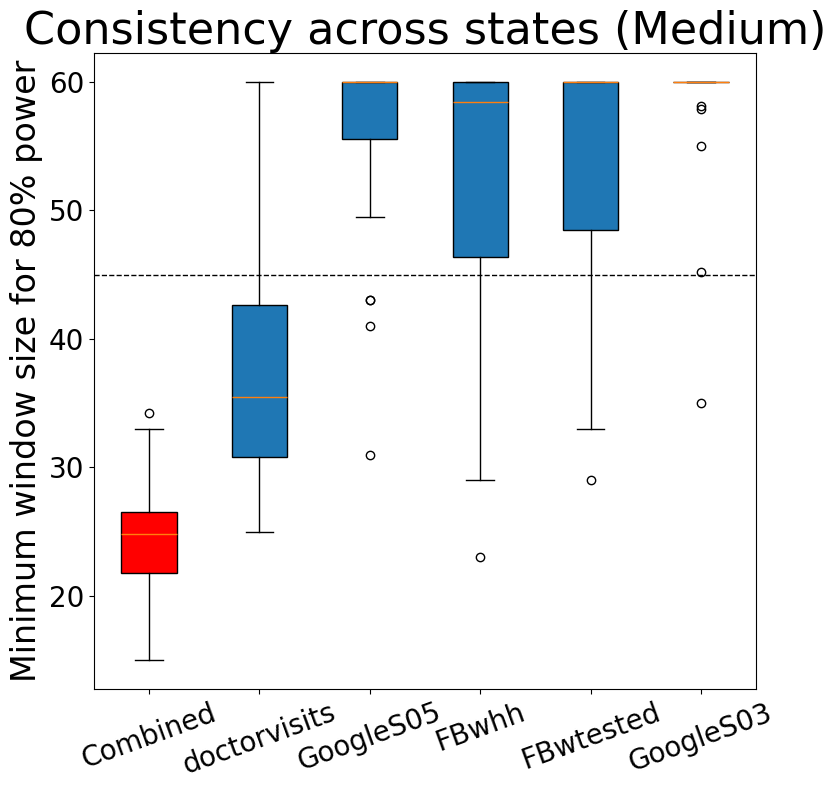

In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

# ── Configurable display (font sizes) ─────────────────────────────────────────
TITLE_FS = 32
AXIS_LABEL_FS = 24
TICK_FS = 20

# ── Configurable threshold ────────────────────────────────────────────────────
threshold = 0.8

focal_stream = "1"
# ── Datasets to iterate (prefix replaces the "1" in filenames) ───────────────
datasets = ["1", #"1", #"2",
            #"CPRadmission", "CHNGclaim", "JHUcase",
            "doctorvisits", "GoogleS05", "FBwhh", "FBwtested", "GoogleS03",
            #"GoogleS04", "QUIDELpositive", "FBwcli", "FBpositive"
           ]
label_map = {
    "CPRadmission": "CPRadmission",
    "CHNGclaim": "CHNGclaim",
    "JHUcase": "JHUcase",
    "doctorvisits": "doctorvisits",
    "GoogleS05": "GoogleS05",
    "FBwhh": "FBwhh",
    "FBwtested": "FBwtested",
    "GoogleS03": "GoogleS03",
    "GoogleS04": "GoogleS04",
    "QUIDELpositive": "QUIDELpositive",
    "FBwcli": "FBwcli",
    "FBpositive": "FBpositive",
    "0": "Combined",
    "1": "Combined",
    "2": "Combined"

}

# ── Window sizes ─────────────────────────────────────────────────────────────
ws_vals = list(range(5, 46, 2))  # 5, 7, …, 45

def compute_min_ws_for_dataset(prefix: str, thresh: float) -> pd.Series:
    """Return Series of min_ws (indexed by HRR) for a given dataset prefix."""
    powers = {}
    for ws in ws_vals:
        df = pd.read_csv(
            f"../hrr_results/{prefix}_{ws}.csv",
            names=["hrr", "power"],
            header=None,
            skiprows=1
        )
        df["hrr"] = df["hrr"].astype(str).str.zfill(3)
        powers[ws] = df.set_index("hrr")["power"]

    powers_df = pd.DataFrame(powers)  # rows = HRR, cols = ws

    def first_ws(row, thresh_val):
        for w in ws_vals:
            if row[w] > thresh_val:
                return w
        return np.nan

    return powers_df.apply(first_ws, axis=1, thresh_val=thresh).rename("min_ws")

# Ensure HRR key formatted for merge once
hrr_with_geo["hrr"] = hrr_with_geo["hrr"].astype(str).str.zfill(3)

# ── Collect per-state means (NaNs→60 before averaging) ───────────────────────
state_means_by_ds = {}
for ds in datasets:
    needed_ws = compute_min_ws_for_dataset(ds, threshold)  # Series indexed by HRR
    merged = hrr_with_geo.merge(needed_ws, left_on="hrr", right_index=True, how="inner")

    # Treat NaNs as 60 before averaging to represent "never reached 80% power"
    merged["min_ws_filled"] = merged["min_ws"].fillna(60).astype(float)

    # Average by state
    state_means = (
        merged.groupby("hrrstate", dropna=False)["min_ws_filled"]
        .mean()
        .dropna()
        .astype(float)
        .values
    )

    if state_means.size > 0:
        state_means_by_ds[ds] = state_means


# ── Print variation (variance & std) on state-level means ────────────────────
print("Variation by dataset on STATE means (sample variance, ddof=1):")
variances = {}
stddevs = {}
for ds, vals in state_means_by_ds.items():
    var = np.var(vals, ddof=1) if vals.size > 1 else np.nan
    sd = np.std(vals, ddof=1) if vals.size > 1 else np.nan
    variances[ds] = var
    stddevs[ds] = sd
    print(f"  {label_map[ds]:>16}: variance = {var:.4f} | std = {sd:.4f} | n_states = {vals.size}")

# ── One-sided F-tests on state-level means: Var(1) < Var(other)? ─────────────
# H0: sigma_1^2 >= sigma_other^2   vs   H1: sigma_1^2 < sigma_other^2
ref_vals = state_means_by_ds[focal_stream]
n1 = ref_vals.size
if n1 < 2:
    raise ValueError('Need at least two states for "1" to test variance.')

s1_sq = np.var(ref_vals, ddof=1)

print("\nOne-sided F-tests on state means (Var(Combined Medium) < Var(other)):")
for ds, vals in state_means_by_ds.items():
    if ds == focal_stream:
        continue
    n2 = vals.size
    if n2 < 2:
        print(f"  {label_map[ds]:>16}: insufficient state count for variance test (n_states={n2})")
        continue

    s2_sq = np.var(vals, ddof=1)
    F = s1_sq / s2_sq
    df1, df2 = n1 - 1, n2 - 1
    p_lower = stats.f.cdf(F, df1, df2)  # one-sided (lower tail) p-value
    print(f"  {label_map[ds]:>16}: F = {F:.4f}, df=({df1},{df2}), p(one-sided) = {p_lower:.6f}")

# ── Matplotlib box plot (square figure) ──────────────────────────────────────
labels = [label_map[ds] for ds in datasets if ds in state_means_by_ds]
data_for_boxes = [state_means_by_ds[ds] for ds in datasets if ds in state_means_by_ds]

plt.figure(figsize=(8,8))  # square
box = plt.boxplot(
    data_for_boxes,
    labels=labels,
    vert=True,
    patch_artist=True,
    showfliers=True
)

# Color the first box red
box["boxes"][0].set_facecolor("red")

# Horizontal dashed line at 45
plt.axhline(y=45, color="black", linestyle="--", linewidth=1)

plt.title("Consistency across states (Medium)", fontsize=TITLE_FS)
plt.ylabel("Minimum window size for 80% power", fontsize=AXIS_LABEL_FS)
plt.xticks(fontsize=TICK_FS, rotation=20)
plt.yticks(fontsize=TICK_FS)
plt.tight_layout()
plt.savefig(f'{focal_stream}_state_variance.png', dpi=300, bbox_inches='tight')
plt.show()



In [ ]:
Variation by dataset on STATE means (sample variance, ddof=1):
          Combined: variance = 17.6997 | std = 4.2071 | n_states = 32
      doctorvisits: variance = 105.3560 | std = 10.2643 | n_states = 32
         GoogleS05: variance = 51.4092 | std = 7.1700 | n_states = 32
             FBwhh: variance = 105.5215 | std = 10.2724 | n_states = 32
         FBwtested: variance = 90.7202 | std = 9.5247 | n_states = 32
         GoogleS03: variance = 25.8923 | std = 5.0884 | n_states = 32

One-sided F-tests on state means (Var(Combined Medium) < Var(other)):
      doctorvisits: F = 0.1680, df=(31,31), p(one-sided) = 0.000002
         GoogleS05: F = 0.3443, df=(31,31), p(one-sided) = 0.001992
             FBwhh: F = 0.1677, df=(31,31), p(one-sided) = 0.000002
         FBwtested: F = 0.1951, df=(31,31), p(one-sided) = 0.000009
         GoogleS03: F = 0.6836, df=(31,31), p(one-sided) = 0.147467